In [2]:

import pandas as pd
import utils
import importlib
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
importlib.reload(utils)

<module 'utils' from '/Users/vittoriameroni/Downloads/utils.py'>

In [4]:
beers_adv = pd.read_csv("data/birre/BeerAdvocate/beers.csv", sep=",")
breweries_adv = pd.read_csv("data/birre/BeerAdvocate/breweries.csv", sep=",")
users_adv = pd.read_csv("data/birre/BeerAdvocate/users.csv", sep=",")

In [8]:
utils.ensure_col_types(beers_adv,
                       ['beer_id', 'brewery_id', 'nbr_ratings', 'nbr_reviews', 'nbr_matched_valid_ratings'],
                       ['abv'],
                       ['beer_name', 'brewery_name', 'style'])

In [10]:
beers_adv.head()

,beer_id,beer_name,brewery_id,brewery_name,style,nbr_ratings,nbr_reviews,avg,ba_score,bros_score,abv,avg_computed,zscore,nbr_matched_valid_ratings,avg_matched_valid_ratings
0,166064,Nashe Moskovskoe,39912,Abdysh-Ata (Абдыш Ата),Euro Pale Lager,0,0,NaN,NaN,NaN,4.7,NaN,NaN,0,NaN
1,166065,Nashe Pivovskoe,39912,Abdysh-Ata (Абдыш Ата),Euro Pale Lager,0,0,NaN,NaN,NaN,3.8,NaN,NaN,0,NaN
2,166066,Nashe Shakhterskoe,39912,Abdysh-Ata (Абдыш Ата),Euro Pale Lager,0,0,NaN,NaN,NaN,4.8,NaN,NaN,0,NaN
3,166067,Nashe Zhigulevskoe,39912,Abdysh-Ata (Абдыш Ата),Euro Pale Lager,0,0,NaN,NaN,NaN,4.0,NaN,NaN,0,NaN
4,166063,Zhivoe,39912,Abdysh-Ata (Абдыш Ата),Euro Pale Lager,0,0,NaN,NaN,NaN,4.5,NaN,NaN,0,NaN


Keep only beers that have atleast one review and one rating. Only beers that have been tried are wanted

In [13]:
beers_adv_filt = beers_adv[(beers_adv['nbr_ratings'] != 0) & (beers_adv['nbr_reviews'] != 0)].copy()

In [15]:
beers_adv_filt['nbr_ratings'].describe()

count    166649.000000
mean         49.216653
std         298.336124
min           1.000000
25%           2.000000
50%           5.000000
75%          17.000000
max       16509.000000
Name: nbr_ratings, dtype: float64

In [17]:
beers_adv_filt['nbr_reviews'].describe()

count    166649.000000
mean         15.539163
std          88.846266
min           1.000000
25%           1.000000
50%           2.000000
75%           5.000000
max        3899.000000
Name: nbr_reviews, dtype: float64

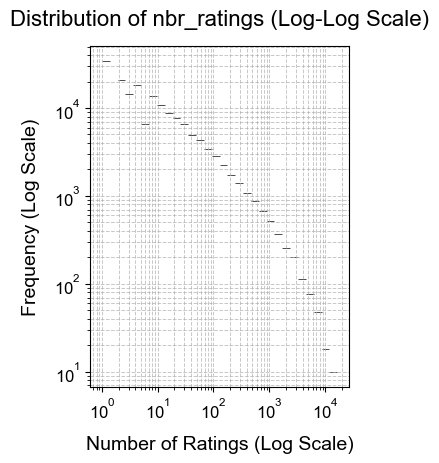

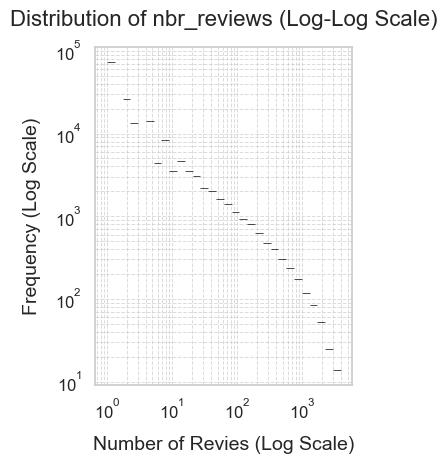

In [19]:
plt.subplot(121)
sns.set_theme(style="whitegrid")
sns.histplot(beers_adv_filt['nbr_ratings'], log_scale=(True, True), bins=30, color="steelblue", edgecolor="black")
plt.xlabel('Number of Ratings (Log Scale)', fontsize=14, labelpad=10)
plt.ylabel('Frequency (Log Scale)', fontsize=14, labelpad=10)
plt.title('Distribution of nbr_ratings (Log-Log Scale)', fontsize=16, pad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(visible=True, which='both', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

plt.subplot(122)
sns.set_theme(style="whitegrid")
sns.histplot(beers_adv_filt['nbr_reviews'], log_scale=(True, True), bins=30, color="steelblue", edgecolor="black")
plt.xlabel('Number of Revies (Log Scale)', fontsize=14, labelpad=10)
plt.ylabel('Frequency (Log Scale)', fontsize=14, labelpad=10)
plt.title('Distribution of nbr_reviews (Log-Log Scale)', fontsize=16, pad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(visible=True, which='both', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

Duplicates dealing:

In [22]:
print(beers_adv_filt['beer_id'].duplicated().any())

duplicates = beers_adv_filt['beer_id'].duplicated()
duplicates.describe()

False


count     166649
unique         1
top        False
freq      166649
Name: beer_id, dtype: object

In [24]:
duplicated_beer_id_rows = beers_adv_filt[beers_adv_filt['beer_id'].duplicated(keep=False)]
duplicated_beer_id_rows.head()

,beer_id,beer_name,brewery_id,brewery_name,style,nbr_ratings,nbr_reviews,avg,ba_score,bros_score,abv,avg_computed,zscore,nbr_matched_valid_ratings,avg_matched_valid_ratings


Once seen that duplications are repeated entries they can be removed easily:

In [27]:
beers_adv_filt_unique = beers_adv_filt.drop_duplicates(subset='beer_id', keep='first').reset_index(drop=True)

utils.dataset_information(beers_adv_filt_unique, "Filtered + Unique Beers_BA")



########################################################
We are starting analysing dataset Filtered + Unique Beers_BA
- Dimension of starting dataset: (166649, 15)
- Columns of dataset:  Index(['beer_id', 'beer_name', 'brewery_id', 'brewery_name', 'style',
       'nbr_ratings', 'nbr_reviews', 'avg', 'ba_score', 'bros_score', 'abv',
       'avg_computed', 'zscore', 'nbr_matched_valid_ratings',
       'avg_matched_valid_ratings'],
      dtype='object')
- Are all the id unique? Answer: True
- Are there some values that are NaN inside the dataset? Answer: True
Head: 
    beer_id           beer_name  brewery_id  \
0   142544               Régab       37262   
1    19590       Barelegs Brew       10093   
2    19827            Legbiter       10093   
3    20841   St. Patrick's Ale       10093   
4    20842  St. Patrick's Best       10093   

                                brewery_name             style  nbr_ratings  \
0  Societe des Brasseries du Gabon (SOBRAGA)   Euro Pale Lager         

In [29]:
beers_adv_filt_unique['beer_id'].duplicated().describe()

count     166649
unique         1
top        False
freq      166649
Name: beer_id, dtype: object

### Breweries

In [32]:
utils.dataset_information(breweries_adv, "Breweries_BA")



########################################################
We are starting analysing dataset Breweries_BA
- Dimension of starting dataset: (16758, 4)
- Columns of dataset:  Index(['id', 'location', 'name', 'nbr_beers'], dtype='object')
- Are all the id unique? Answer: True
- Are there some values that are NaN inside the dataset? Answer: False
Head: 
       id    location                    name  nbr_beers
0  39912  Kyrgyzstan  Abdysh-Ata (Абдыш Ата)          5
1  39913  Kyrgyzstan             Arpa (АРПА)          1
2  39914  Kyrgyzstan               Bear Beer          4
3  39915  Kyrgyzstan             Blonder Pub          4
4  39916  Kyrgyzstan            Kellers Bier          2


In [34]:
breweries_adv['nbr_beers'].describe()

count    16758.000000
mean        21.056331
std         69.417841
min          0.000000
25%          2.000000
50%          6.000000
75%         18.000000
max       1196.000000
Name: nbr_beers, dtype: float64

Drop breweries with null `nbr_beers`:

In [37]:
breweries_adv_filt = breweries_adv[(breweries_adv['nbr_beers'] != 0)].copy()
breweries_adv_filt['nbr_beers'].describe()

count    14522.000000
mean        24.298444
std         74.041044
min          1.000000
25%          3.000000
50%          8.000000
75%         21.000000
max       1196.000000
Name: nbr_beers, dtype: float64

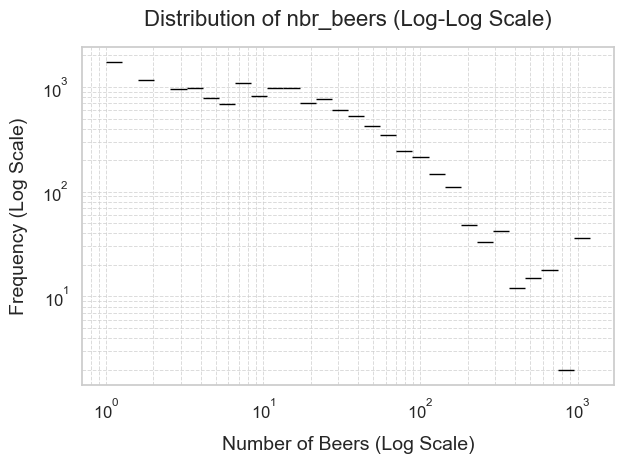

In [39]:
sns.set_theme(style="whitegrid")
sns.histplot(breweries_adv_filt['nbr_beers'], log_scale=(True, True), bins=30, color="steelblue", edgecolor="black")
plt.xlabel('Number of Beers (Log Scale)', fontsize=14, labelpad=10)
plt.ylabel('Frequency (Log Scale)', fontsize=14, labelpad=10)
plt.title('Distribution of nbr_beers (Log-Log Scale)', fontsize=16, pad=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(visible=True, which='both', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

Location analysis:

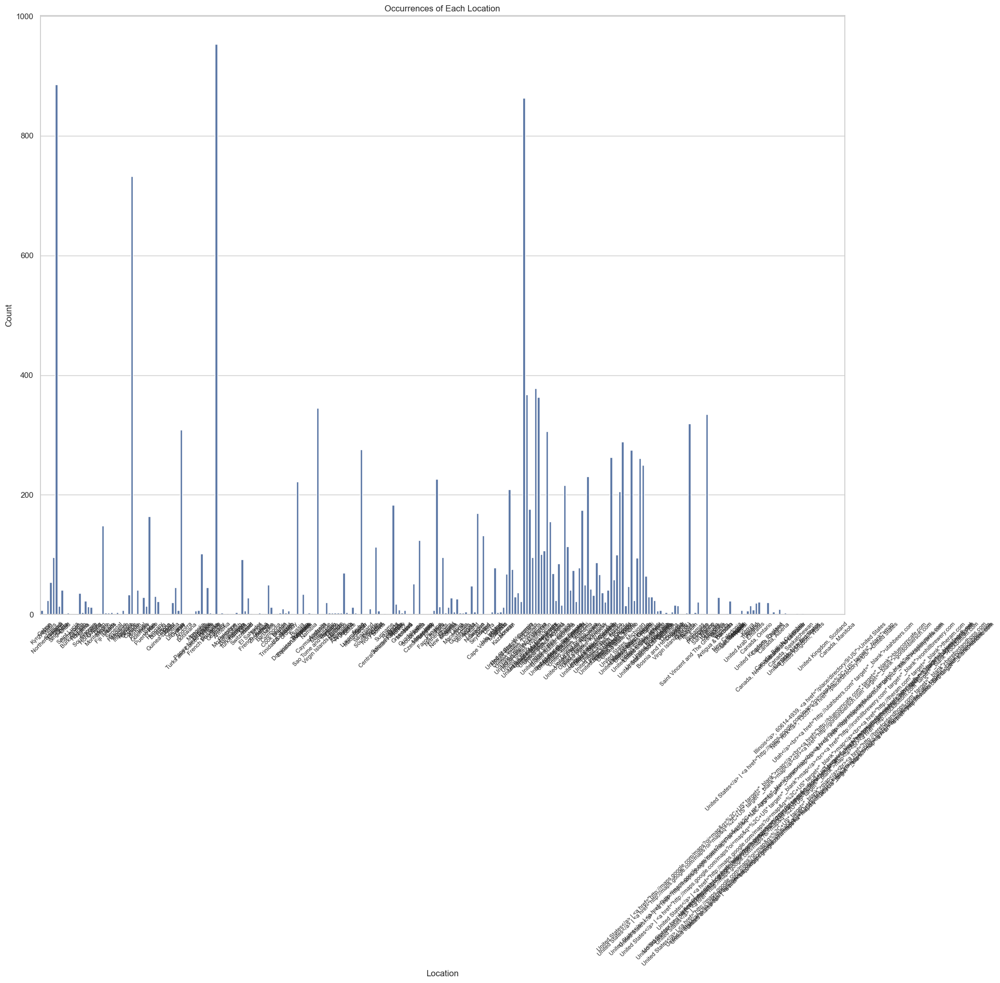

In [42]:
plt.figure(figsize=(20, 15))
sns.countplot(data=breweries_adv_filt, x='location')
plt.title('Occurrences of Each Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45, fontsize=8) 
plt.show()

Eliminate links added

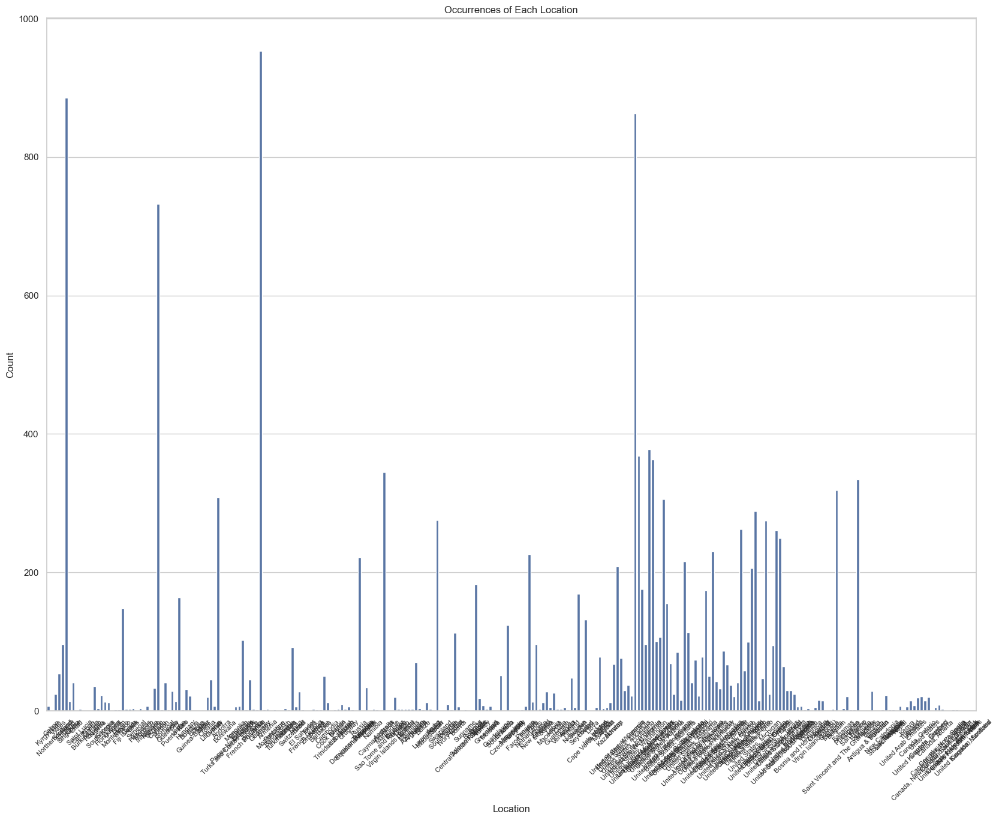

In [45]:
breweries_adv_filt['link'] = breweries_adv_filt['location'].str.contains("href", case=False, na=False)
breweries_adv_filt.loc[breweries_adv_filt['link'] == True, 'location'] = breweries_adv_filt['location'].str.split('<').str[0]
plt.figure(figsize=(20, 15))
sns.countplot(data=breweries_adv_filt, x='location')
plt.title('Occurrences of Each Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45, fontsize=8) 
plt.show()

Lets start by dividing the locations regions ",":

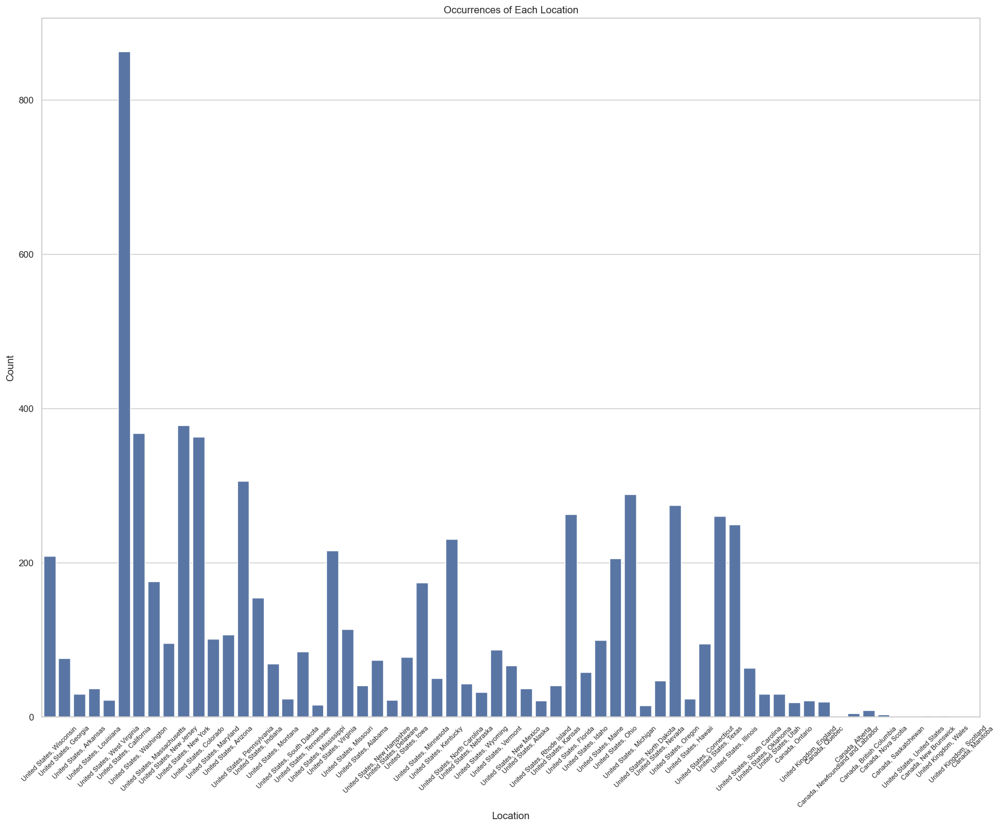

In [48]:
breweries_adv_filt['Regions'] = breweries_adv_filt['location'].str.contains(r"[,\|<]", case=False, na=False)

plt.figure(figsize=(20, 15))
sns.countplot(data=breweries_adv_filt[breweries_adv_filt['Regions'] == True], x='location')
plt.title('Occurrences of Each Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45, fontsize=8) 
plt.show()

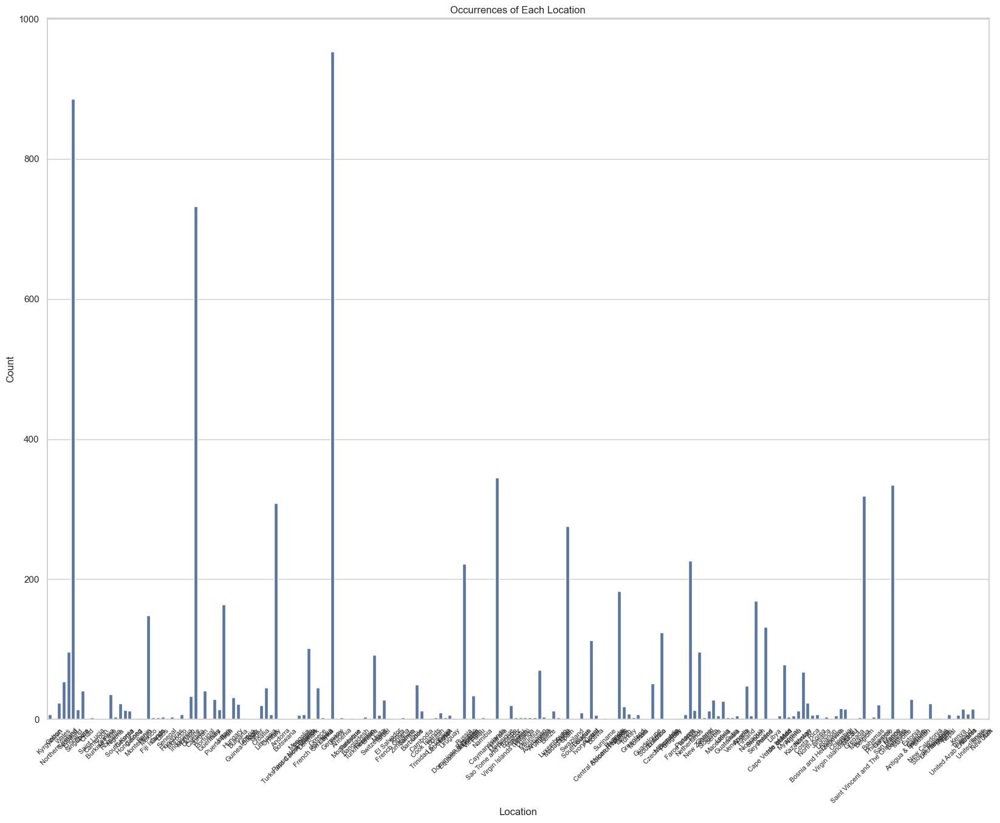

In [50]:
plt.figure(figsize=(20, 15))
sns.countplot(data=breweries_adv_filt[breweries_adv_filt['Regions'] == False], x='location')
plt.title('Occurrences of Each Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45, fontsize=8) 
plt.show()

Lest divide US, Canada and UK into location and region:

In [53]:
breweries_adv_filt[['location', 'location_region']] = breweries_adv_filt['location'].str.split(',', n=1, expand=True)

breweries_adv_filt['location'] = breweries_adv_filt['location'].str.strip()
breweries_adv_filt['location_region'] = breweries_adv_filt['location_region'].str.strip()

breweries_adv_filt[breweries_adv_filt['Regions']].head()

,id,location,name,nbr_beers,link,Regions,location_region
7986,49595,United States,Copper State Brewing Company,7,False,True,Wisconsin
7987,5522,United States,Corner Pub,13,False,True,Wisconsin
7988,4834,United States,"Courthouse Pub, The",13,False,True,Wisconsin
7989,939,United States,Cross Plains Beer Company,3,False,True,Wisconsin
7990,21405,United States,Dave's BrewFarm,90,False,True,Wisconsin


In [55]:
breweries_adv_filt['US'] = breweries_adv_filt['location'].str.contains("United States", case=False, na=False)
breweries_adv_filt['UK'] = breweries_adv_filt['location'].str.contains("United Kingdom", case=False, na=False)
breweries_adv_filt['Canada'] = breweries_adv_filt['location'].str.contains("Canada", case=False, na=False)

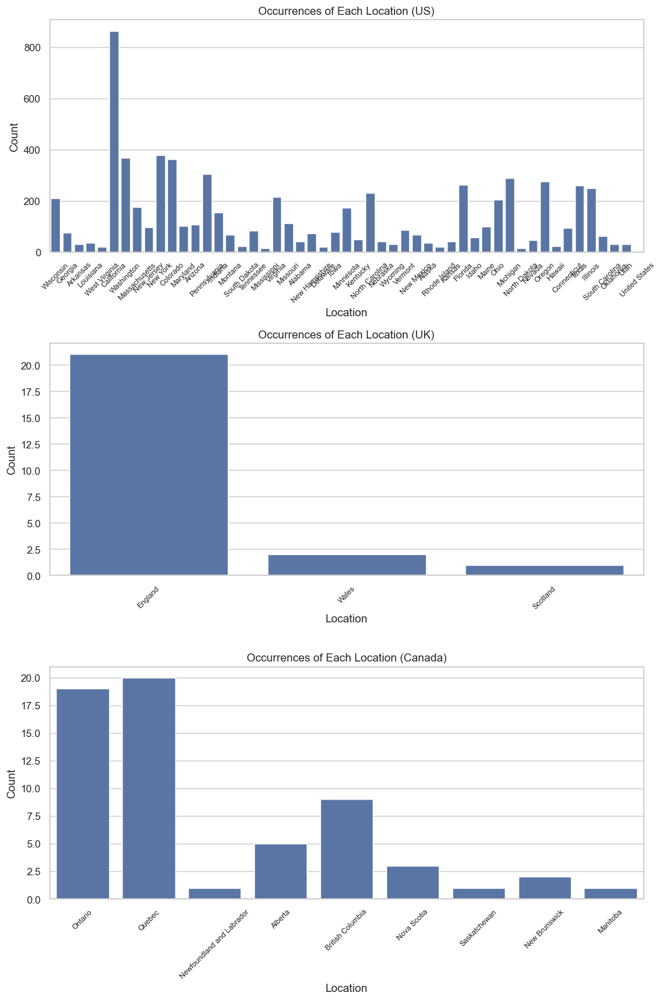

In [57]:
fig, axes = plt.subplots(3, 1, figsize=(10, 15))
sns.countplot(data=breweries_adv_filt[breweries_adv_filt['US'] == True], x='location_region', ax=axes[0])
axes[0].set_title('Occurrences of Each Location (US)')
axes[0].set_xlabel('Location')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45, labelsize=8)

sns.countplot(data=breweries_adv_filt[breweries_adv_filt['UK'] == True], x='location_region', ax=axes[1])
axes[1].set_title('Occurrences of Each Location (UK)')
axes[1].set_xlabel('Location')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45, labelsize=8)

sns.countplot(data=breweries_adv_filt[breweries_adv_filt['Canada'] == True], x='location_region', ax=axes[2])
axes[2].set_title('Occurrences of Each Location (Canada)')
axes[2].set_xlabel('Location')
axes[2].set_ylabel('Count')
axes[2].tick_params(axis='x', rotation=45, labelsize=8)

plt.tight_layout()
plt.show()


In [59]:
breweries_adv_filt.loc[breweries_adv_filt['location_region'] == "United States", 'location_region'] = np.nan

In [61]:
breweries_adv_filt = breweries_adv_filt.drop(columns=['link', 'Regions'], errors='ignore')
breweries_adv_filt.head()

,id,location,name,nbr_beers,location_region,US,UK,Canada
0,39912,Kyrgyzstan,Abdysh-Ata (Абдыш Ата),5,None,False,False,False
1,39913,Kyrgyzstan,Arpa (АРПА),1,None,False,False,False
2,39914,Kyrgyzstan,Bear Beer,4,None,False,False,False
3,39915,Kyrgyzstan,Blonder Pub,4,None,False,False,False
4,39916,Kyrgyzstan,Kellers Bier,2,None,False,False,False


Let's check for duplicates:

In [64]:
print(breweries_adv_filt['id'].duplicated().any())

duplicates = breweries_adv_filt['id'].duplicated()
duplicates.describe()

False


count     14522
unique        1
top       False
freq      14522
Name: id, dtype: object

Now we can merge the location column information to the beers dataset already processed:

In [67]:
breweries_adv_filt.rename(columns={'name': 'brewery_name'}, inplace=True)

beers_adv_filt_unique_location = beers_adv_filt_unique.merge(
    breweries_adv_filt[['brewery_name', 'location', 'location_region', 'US', 'UK', 'Canada']],
    on='brewery_name',
    how='left'
)

beers_adv_filt_unique_location.head()

,beer_id,beer_name,brewery_id,brewery_name,style,nbr_ratings,nbr_reviews,avg,ba_score,bros_score,abv,avg_computed,zscore,nbr_matched_valid_ratings,avg_matched_valid_ratings,location,location_region,US,UK,Canada
0,142544,Régab,37262,Societe des Brasseries du Gabon (SOBRAGA),Euro Pale Lager,1,1,2.88,NaN,NaN,4.5,2.880000,NaN,0,NaN,Gabon,None,False,False,False
1,19590,Barelegs Brew,10093,Strangford Lough Brewing Company Ltd,English Pale Ale,4,4,3.85,NaN,NaN,4.5,3.845000,NaN,0,NaN,Northern Ireland,None,False,False,False
2,19827,Legbiter,10093,Strangford Lough Brewing Company Ltd,English Pale Ale,75,59,3.45,80.0,80.0,4.8,3.439867,-0.649167,59,3.504068,Northern Ireland,None,False,False,False
3,20841,St. Patrick's Ale,10093,Strangford Lough Brewing Company Ltd,English Pale Ale,8,6,3.86,NaN,NaN,6.0,3.888750,0.093110,6,3.768333,Northern Ireland,None,False,False,False
4,20842,St. Patrick's Best,10093,Strangford Lough Brewing Company Ltd,English Bitter,64,48,3.56,82.0,90.0,4.2,3.556094,-0.478579,48,3.580417,Northern Ireland,None,False,False,False


### Users

In [70]:
users_adv = pd.read_csv("data/birre/BeerAdvocate/users.csv", sep=",")

In [72]:
utils.dataset_information(users_adv, "Users_BA")



########################################################
We are starting analysing dataset Users_BA
- Dimension of starting dataset: (153704, 6)
- Columns of dataset:  Index(['nbr_ratings', 'nbr_reviews', 'user_id', 'user_name', 'joined',
       'location'],
      dtype='object')
- Are all the id unique? Answer: False
- Are there some values that are NaN inside the dataset? Answer: True
Head: 
    nbr_ratings  nbr_reviews                user_id        user_name  \
0         7820          465         nmann08.184925          nmann08   
1         2521         2504     stjamesgate.163714      StJamesGate   
2         1797         1143          mdagnew.19527          mdagnew   
3           31           31  helloloser12345.10867  helloloser12345   
4          604          604        cypressbob.3708       cypressbob   

         joined                   location  
0  1.199704e+09  United States, Washington  
1  1.191838e+09    United States, New York  
2  1.116410e+09           Northern Ire

We need to deal with `joined` and `location`:

* `joined`: usage of datetime functions of `pandas` to transform the seconds into proper date structure.
* `location`: same approach as breweries and beers datasets. Division into `location`, `location_region` and booleans for quick identification of US, UK and Canada cases. 

In [75]:
users_adv.head()

,nbr_ratings,nbr_reviews,user_id,user_name,joined,location
0,7820,465,nmann08.184925,nmann08,1.199704e+09,"United States, Washington"
1,2521,2504,stjamesgate.163714,StJamesGate,1.191838e+09,"United States, New York"
2,1797,1143,mdagnew.19527,mdagnew,1.116410e+09,Northern Ireland
3,31,31,helloloser12345.10867,helloloser12345,1.101380e+09,Northern Ireland
4,604,604,cypressbob.3708,cypressbob,1.069326e+09,Northern Ireland


In [77]:
import pandas as pd
import numpy as np
import re

# Example data if needed to simulate users_adv DataFrame
# users_adv = pd.DataFrame({
#     'joined': [1199704000, 1191838000, 1116410000],
#     'location': ['United States, Washington', 'Northern Ireland', 'Canada, Ontario']
# })

# Convert the 'joined' column from UNIX timestamp to datetime
users_adv['joined'] = pd.to_datetime(users_adv['joined'], unit='s')

# Split 'location' into 'location' and 'location_region', filling with NaN where no comma is found
location_split = users_adv['location'].str.split(',', n=1, expand=True)
users_adv['location'] = location_split[0]
users_adv['location_region'] = location_split[1]

# Define pattern for UK-related locations
pattern = r"United Kingdom|Ireland|Northern Ireland|Scotland|England|Wales"

# Create boolean columns for specific regions
users_adv['US'] = users_adv['location'].str.contains("United States", case=False, na=False)
users_adv['UK'] = users_adv['location'].str.contains(pattern, case=False, na=False)
users_adv['Canada'] = users_adv['location'].str.contains("Canada", case=False, na=False)

# Remove redundant 'location_region' values if they match 'United States'
users_adv.loc[users_adv['location_region'] == "United States", 'location_region'] = np.nan

# Check for duplicate user IDs
duplicated_users_id_rows = users_adv[users_adv['user_id'].duplicated(keep=False)]

# Display the updated DataFrame and any duplicate user ID rows
print("Updated DataFrame with location and region separation:")
print(users_adv.head())

print("\nDuplicate user_id rows:")
print(duplicated_users_id_rows.head())



Updated DataFrame with location and region separation:
   nbr_ratings  nbr_reviews                user_id        user_name  \
0         7820          465         nmann08.184925          nmann08   
1         2521         2504     stjamesgate.163714      StJamesGate   
2         1797         1143          mdagnew.19527          mdagnew   
3           31           31  helloloser12345.10867  helloloser12345   
4          604          604        cypressbob.3708       cypressbob   

               joined          location location_region     US     UK  Canada  
0 2008-01-07 11:00:00     United States      Washington   True  False   False  
1 2007-10-08 10:00:00     United States        New York   True  False   False  
2 2005-05-18 10:00:00  Northern Ireland            None  False   True   False  
3 2004-11-25 11:00:00  Northern Ireland            None  False   True   False  
4 2003-11-20 11:00:00  Northern Ireland            None  False   True   False  

Duplicate user_id rows:
Empty DataFra

In [79]:
users_adv_unique= users_adv.drop_duplicates(subset='user_id', keep='first').reset_index(drop=True)
users_adv_unique.head()

,nbr_ratings,nbr_reviews,user_id,user_name,joined,location,location_region,US,UK,Canada
0,7820,465,nmann08.184925,nmann08,2008-01-07 11:00:00,United States,Washington,True,False,False
1,2521,2504,stjamesgate.163714,StJamesGate,2007-10-08 10:00:00,United States,New York,True,False,False
2,1797,1143,mdagnew.19527,mdagnew,2005-05-18 10:00:00,Northern Ireland,None,False,True,False
3,31,31,helloloser12345.10867,helloloser12345,2004-11-25 11:00:00,Northern Ireland,None,False,True,False
4,604,604,cypressbob.3708,cypressbob,2003-11-20 11:00:00,Northern Ireland,None,False,True,False


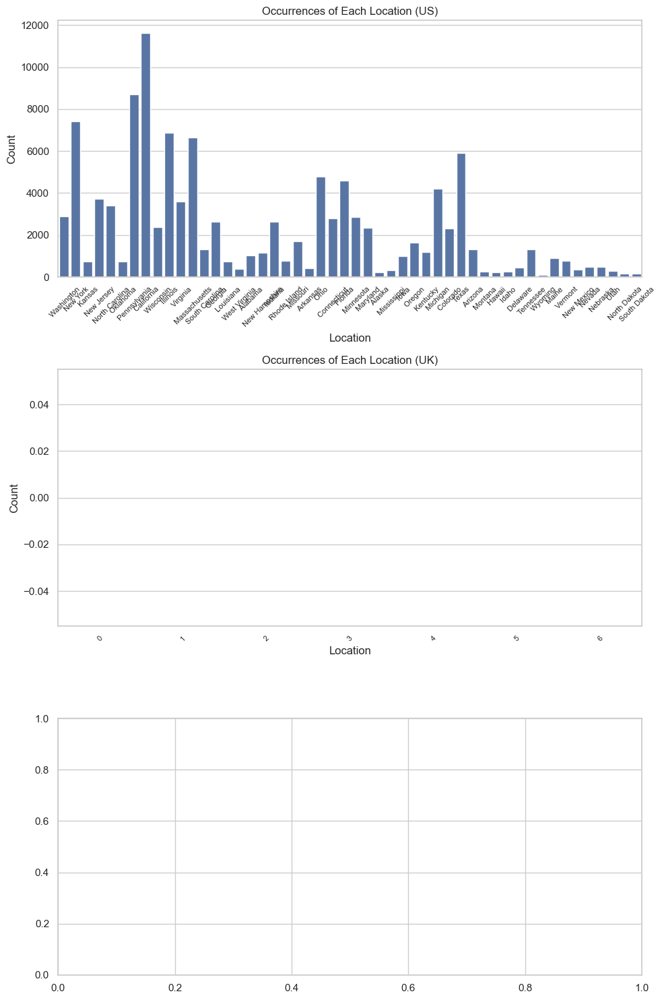

In [81]:
fig, axes = plt.subplots(3, 1, figsize=(10, 15))
sns.countplot(data=users_adv[users_adv['US'] == True], x='location_region', ax=axes[0])
axes[0].set_title('Occurrences of Each Location (US)')
axes[0].set_xlabel('Location')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45, labelsize=8)

sns.countplot(data=users_adv[users_adv['UK'] == True], x='location_region', ax=axes[1])
axes[1].set_title('Occurrences of Each Location (UK)')
axes[1].set_xlabel('Location')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45, labelsize=8)

"""
No regions in canada
sns.countplot(data=users_adv[users_adv['Canada'] == True], x='location_region', ax=axes[2])
axes[2].set_title('Occurrences of Each Location (Canada)')
axes[2].set_xlabel('Location')
axes[2].set_ylabel('Count')
axes[2].tick_params(axis='x', rotation=45, labelsize=8)
"""

plt.tight_layout()
plt.show()

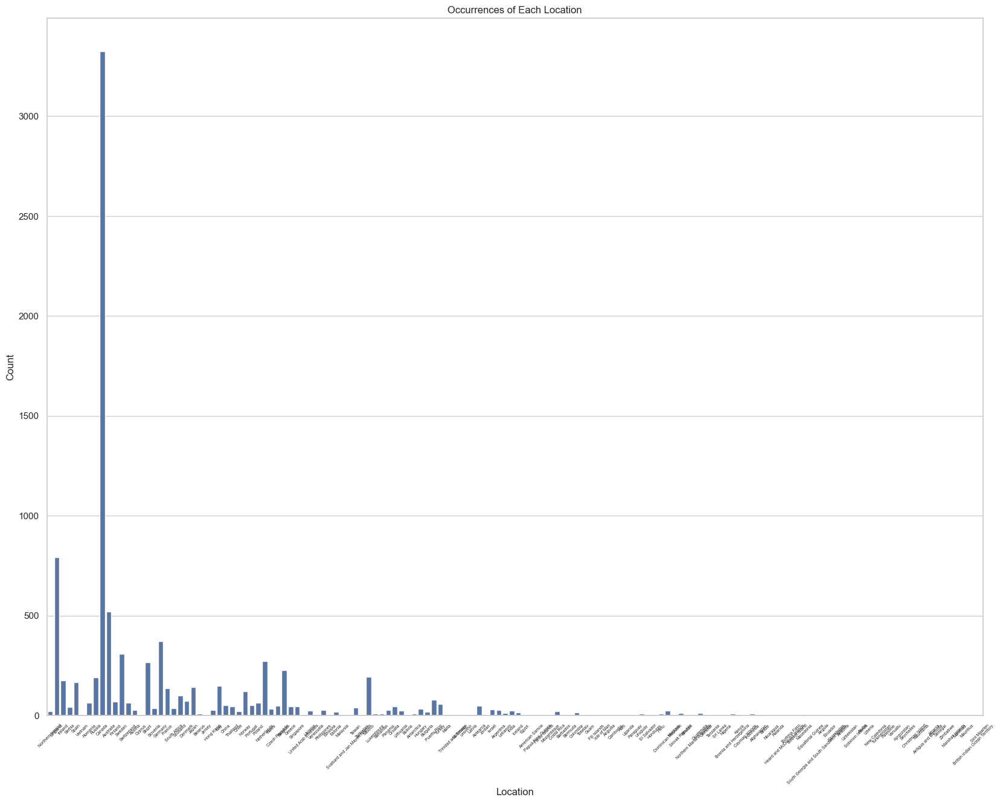

In [83]:
plt.figure(figsize=(20, 15))
sns.countplot(data=users_adv[users_adv['US'] == False], x='location')
plt.title('Occurrences of Each Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45, fontsize=5) 
plt.show()


### Ratings

In [86]:
rating_BA=pd.read_csv('data/birre/BeerAdvocate/ratings_cleaned.csv')
utils.dataset_information(rating_BA, "Ratings RateBeer")



########################################################
We are starting analysing dataset Ratings RateBeer
- Dimension of starting dataset: (8392192, 17)
- Columns of dataset:  Index(['beer_name', 'beer_id', 'brewery_name', 'brewery_id', 'style', 'abv',
       'date', 'user_name', 'user_id', 'appearance', 'aroma', 'palate',
       'taste', 'overall', 'rating', 'text', 'review'],
      dtype='object')
- Are all the id unique? Answer: False
- Are there some values that are NaN inside the dataset? Answer: True
Head: 
        beer_name  beer_id                          brewery_name  brewery_id  \
0  Barelegs Brew    19590  Strangford Lough Brewing Company Ltd       10093   
1  Barelegs Brew    19590  Strangford Lough Brewing Company Ltd       10093   
2  Barelegs Brew    19590  Strangford Lough Brewing Company Ltd       10093   
3  Barelegs Brew    19590  Strangford Lough Brewing Company Ltd       10093   
4       Legbiter    19827  Strangford Lough Brewing Company Ltd       10093   

 

In [146]:
rating_BA_cleaned = rating_BA.dropna(subset=['rating', 'date'])

rating_BA_cleaned = rating_BA.drop_duplicates(subset=['beer_name','date', 'user_name'])

rating_min = rating_BA_cleaned['rating'].min()
rating_max = rating_BA_cleaned['rating'].max()



/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/3595352337.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rating_BA_cleaned['rating_normalized'] = (rating_BA_cleaned['rating'] - rating_min) / (rating_max - rating_min)


,rating,rating_normalized
0,3.67,0.6675
1,3.73,0.6825
2,3.98,0.7450
3,4.00,0.7500
4,3.25,0.5625


In [90]:
ratings_adv_locations = rating_BA_cleaned.merge(
    breweries_adv_filt[['brewery_name', 'location', 'location_region', 'US', 'UK', 'Canada']],
    on='brewery_name',
    how='left'
)



In [91]:

columns_rename = {
    'location': 'location_beer',
    'location_region': 'location_region_beer',
    'US': 'US_beer',
    'UK': 'UK_beer',
    'Canada': 'Canada_beer'
}
ratings_adv_locations = ratings_adv_locations.rename(columns=columns_rename)

In [92]:
ratings_adv_locations_complete = ratings_adv_locations.merge(
    users_adv_unique[['user_name', 'location', 'location_region', 'US', 'UK', 'Canada']],
    on='user_name',
    how='left'
)

columns_rename = {
    'location': 'location_user',
    'location_region': 'location_region_user',
    'US': 'US_user',
    'UK': 'UK_user',
    'Canada': 'Canada_user'
}
ratings_adv_locations_complete = ratings_adv_locations_complete.rename(columns=columns_rename)


In [106]:
ratings_adv_locations_complete['date'] = pd.to_datetime(ratings_adv_locations_complete['date'], unit='s')
ratings_adv_locations_complete['year'] = ratings_adv_locations_complete['date'].dt.year

ratings_adv_locations_complete.head()

,beer_name,beer_id,brewery_name,brewery_id,style,abv,date,user_name,user_id,appearance,...,location_region_beer,US_beer,UK_beer,Canada_beer,location_user,location_region_user,US_user,UK_user,Canada_user,year
0,Barelegs Brew,19590,Strangford Lough Brewing Company Ltd,10093,English Pale Ale,4.5,2009-02-20 11:00:00,StJamesGate,stjamesgate.163714,3.0,...,None,False,False,False,United States,New York,True,False,False,2009
1,Barelegs Brew,19590,Strangford Lough Brewing Company Ltd,10093,English Pale Ale,4.5,2006-03-13 11:00:00,mdagnew,mdagnew.19527,4.0,...,None,False,False,False,Northern Ireland,None,False,True,False,2006
2,Barelegs Brew,19590,Strangford Lough Brewing Company Ltd,10093,English Pale Ale,4.5,2004-12-01 11:00:00,helloloser12345,helloloser12345.10867,4.0,...,None,False,False,False,Northern Ireland,None,False,True,False,2004
3,Barelegs Brew,19590,Strangford Lough Brewing Company Ltd,10093,English Pale Ale,4.5,2004-08-30 10:00:00,cypressbob,cypressbob.3708,4.0,...,None,False,False,False,Northern Ireland,None,False,True,False,2004
4,Legbiter,19827,Strangford Lough Brewing Company Ltd,10093,English Pale Ale,4.8,2014-12-01 11:00:00,Hellpop65,hellpop65.48993,NaN,...,None,False,False,False,United States,Kansas,True,False,False,2014


In [108]:
ratings_adv_locations_complete_filt = ratings_adv_locations_complete.dropna(subset=['beer_id', 'user_id'])
utils.dataset_information(ratings_adv_locations_complete_filt, "Ratings filtered")



########################################################
We are starting analysing dataset Ratings filtered
- Dimension of starting dataset: (9118334, 28)
- Columns of dataset:  Index(['beer_name', 'beer_id', 'brewery_name', 'brewery_id', 'style', 'abv',
       'date', 'user_name', 'user_id', 'appearance', 'aroma', 'palate',
       'taste', 'overall', 'rating', 'text', 'review', 'location_beer',
       'location_region_beer', 'US_beer', 'UK_beer', 'Canada_beer',
       'location_user', 'location_region_user', 'US_user', 'UK_user',
       'Canada_user', 'year'],
      dtype='object')
- Are all the id unique? Answer: False
- Are there some values that are NaN inside the dataset? Answer: True
Head: 
        beer_name  beer_id                          brewery_name  brewery_id  \
0  Barelegs Brew    19590  Strangford Lough Brewing Company Ltd       10093   
1  Barelegs Brew    19590  Strangford Lough Brewing Company Ltd       10093   
2  Barelegs Brew    19590  Strangford Lough Brewing Co

In [109]:
utils.ensure_col_types2(ratings_adv_locations_complete_filt, ['beer_id','brewery_id','user_id'],['abv'],['beer_name','brewery_name','style','user_name'])

AttributeError: module 'utils' has no attribute 'ensure_col_types2'

In [ ]:
missing_beers = ratings_adv_locations_complete[~ratings_adv_locations_complete['beer_id'].isin(beers_adv_filt_unique_location['beer_id'])]

if missing_beers.empty:
    print("All 'beers_id' in the ratings dataset are present in the beers_adv dataset.")
else:
    print(f"The following 'beers_id' are missing in beers_adv:\n{missing_beers['beer_id'].unique()}")


In [ ]:
ratings_adv_locations_complete_filt = ratings_adv_locations_complete_filt[
    ratings_adv_locations_complete_filt['beer_id'].isin(beers_adv_filt_unique_location['beer_id']) & ratings_adv_locations_complete_filt['user_name'].isin(users_adv_unique['user_name'])
]
utils.dataset_information(ratings_adv_locations_complete_filt, "Missing beers")

## Processed savings

In [ ]:
confirmation = input("Do you want to save the processed files? Type 'yes' to confirm: ").strip().lower()

if confirmation == 'yes':
    utils.write_csv_into_directory('data/Processed/BeerAdvocate', 'beers_processed.csv', beers_adv_filt_unique_location)
    utils.write_csv_into_directory('data/Processed/BeerAdvocate', 'breweries_processed.csv', breweries_adv_filt)
    utils.write_csv_into_directory('data/Processed/BeerAdvocate', 'users_processed.csv', users_adv_unique)
    utils.write_csv_into_directory('data/Processed/BeerAdvocate', 'ratings_processed.csv', ratings_adv_locations_complete_filt)
    print("Files saved successfully!")
else:
    print("Operation canceled. No files were saved.")

## task 3

In [113]:
total_ba=ratings_adv_locations_complete_filt.copy()


In [115]:

# Step 1: Count reviews per group and filter based on threshold
review_counts_ba = total_ba.groupby(['beer_id', 'year', 'location_user']).size().reset_index(name='review_count')

# Step 2: Merge back to the main DataFrame and filter for groups with at least 5 reviews
reviews_with_counts_ba = pd.merge(total_ba, review_counts_ba, on=['beer_id', 'year', 'location_user'])
filtered_reviews = reviews_with_counts[reviews_with_counts['review_count'] >= 5]

# Step 3: Calculate weighted average rating for each group
weighted_avg_ratings_ba = filtered_reviews_ba.groupby(['beer_id', 'beer_name', 'year', 'review_count','location_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')

weighted_avg_ratings_ba['rank'] = (
    weighted_avg_ratings_ba.sort_values(['year', 'location_user', 'weighted_avg_rating', 'review_count'], 
                                        ascending=[True, True, False, False])
    .groupby(['year', 'location_user'])
    .cumcount() + 1
)

# Check results
weighted_avg_ratings_ba.head()


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/1403869045.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_ratings = filtered_reviews.groupby(['beer_id', 'beer_name', 'year', 'review_count','location_user']).apply(


,beer_id,beer_name,year,review_count,location_user,weighted_avg_rating,rank
0,4,Wildcatter's Crude Stout,2003,5,United States,3.834000,965
1,5,Amber,2002,20,United States,3.423500,901
2,5,Amber,2003,21,United States,3.378571,1805
3,5,Amber,2004,30,United States,3.398667,2148
4,5,Amber,2005,32,United States,3.421875,2363


In [116]:
# Pivot data for heatmap
top_ranked_beers_ba = weighted_avg_ratings_ba[weighted_avg_ratings_ba['rank'] == 1]

pivot_data_ba =top_ranked_beers_ba.pivot_table(
    values='weighted_avg_rating', 
    index='year', 
    columns='location_user', 
    aggfunc='mean'
)





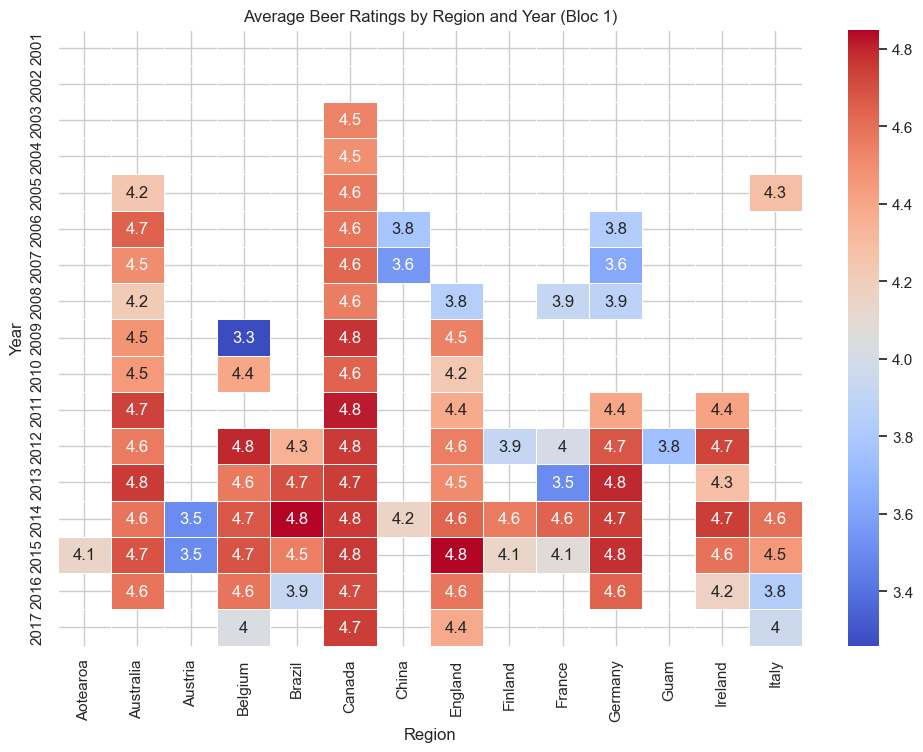

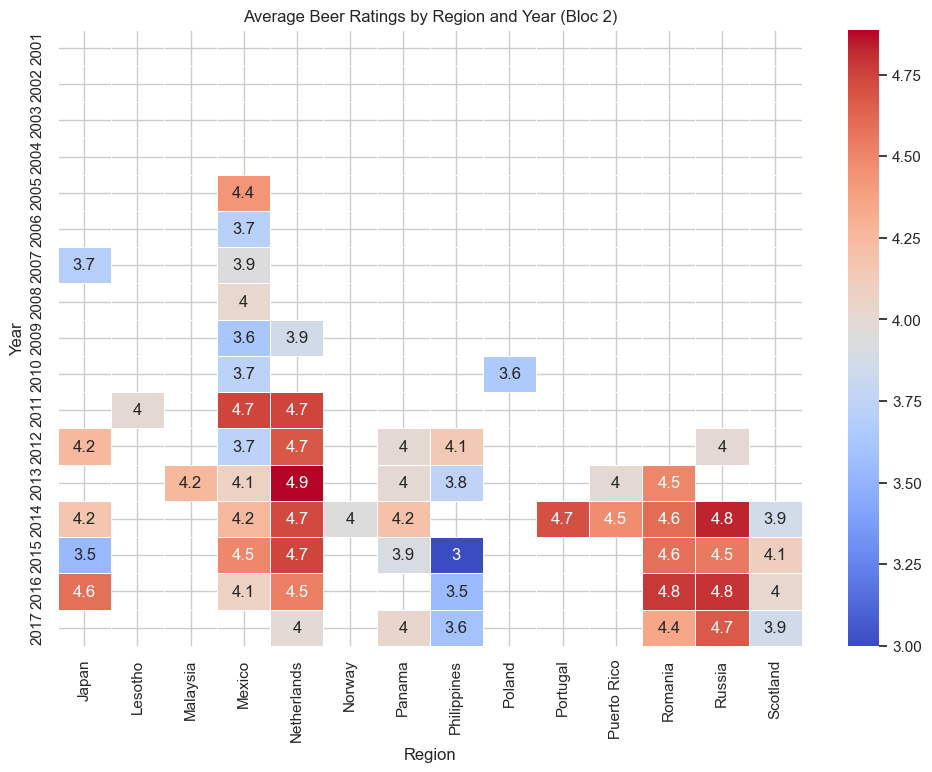

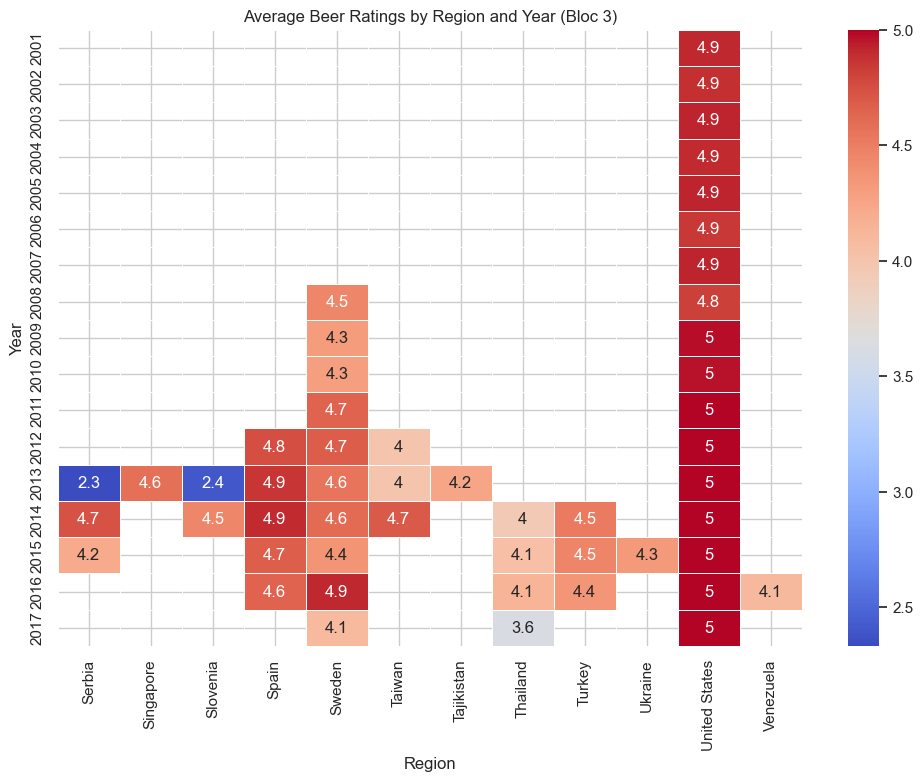

In [117]:

chunk_size = 14


num_chunks = len(pivot_data_ba.columns) // chunk_size + (1 if len(pivot_data.columns) % chunk_size != 0 else 0)

for i in range(num_chunks):
    start = i * chunk_size
    end = start + chunk_size
    chunk = pivot_data_ba.iloc[:, start:end]  # Seleziona le colonne del blocco
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(chunk, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title(f'Average Beer Ratings by Region and Year, BeerAdvocate (Bloc {i+1})')
    plt.xlabel('Region')
    plt.ylabel('Year')
    plt.show()


In [122]:

review_counts_us_ba= total_ba.groupby(['beer_id', 'year', 'location_region_user']).size().reset_index(name='review_count')


reviews_with_counts_us_ba = pd.merge(total_ba, review_counts_us_ba, on=['beer_id', 'year', 'location_region_user'])
filtered_reviews_us_ba = reviews_with_counts_us_ba[reviews_with_counts_us_ba['review_count'] >= 5]

weighted_avg_ratings_us_ba = filtered_reviews_us_ba.groupby(['beer_id', 'beer_name', 'year','review_count', 'location_region_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')


weighted_avg_ratings_us_ba['rank'] = (
    weighted_avg_ratings_us_ba.sort_values(['year', 'location_region_user', 'weighted_avg_rating', 'review_count'], 
                                        ascending=[True, True, False, False])
    .groupby(['year', 'location_region_user'])
    .cumcount() + 1
)



/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/1203448949.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_ratings_us = filtered_reviews_us.groupby(['beer_id', 'beer_name', 'year','review_count', 'location_region_user']).apply(


In [123]:
# Pivot data for heatmap
top_ranked_beers_us_ba = weighted_avg_ratings_us_ba[weighted_avg_ratings_us_ba['rank'] == 1]

pivot_data_us_ba= top_ranked_beers_us_ba.pivot_table(
    values='weighted_avg_rating', 
    index='year', 
    columns='location_region_user', 
    aggfunc='mean'
)




location_region_user   Alabama    Alaska   Arizona  Arkansas  California  \
year                                                                       
2001                       NaN       NaN       NaN       NaN    4.393333   
2002                       NaN       NaN  4.060000       NaN    4.738000   
2003                       NaN  3.720000  4.760000       NaN    4.840000   
2004                  3.970000  4.500000  4.670000       NaN    4.742500   
2005                       NaN  4.500000  4.200000  4.220000    4.800000   
2006                  4.450000       NaN  4.641667  4.550000    4.850000   
2007                       NaN       NaN  4.770000  4.530000    4.791667   
2008                  4.534000  3.500000  4.690000  4.560000    4.740000   
2009                  4.676667  4.120000  4.526000  4.050000    4.920000   
2010                  4.755000  4.130000  4.612857       NaN    4.820000   
2011                  4.920000  3.850000  4.866364  3.933333    5.000000   
2012        

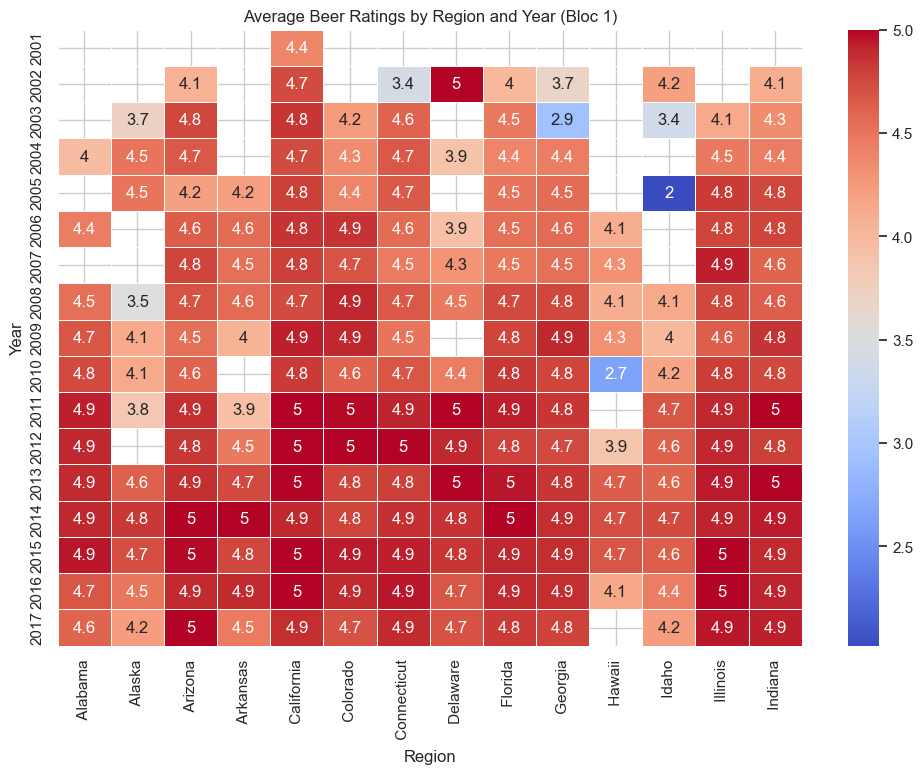

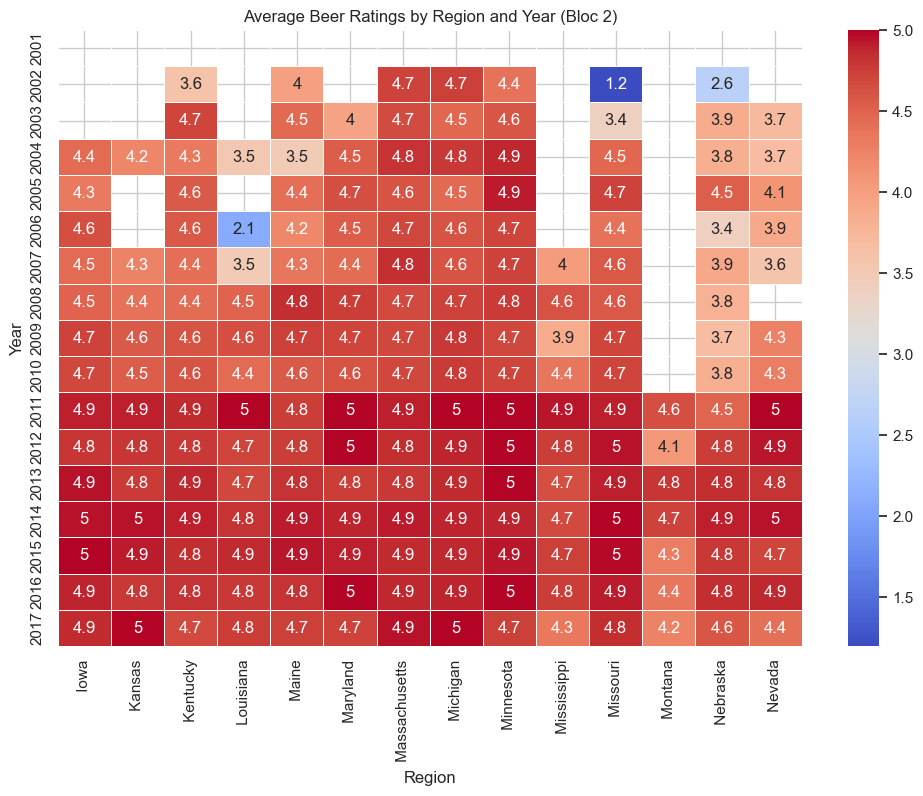

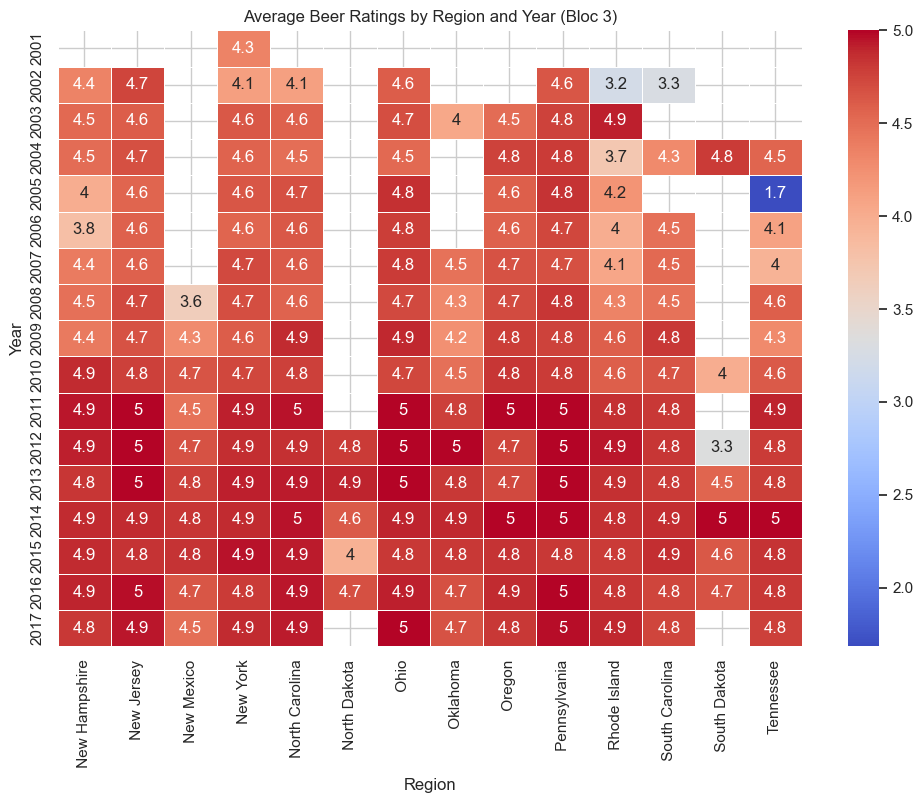

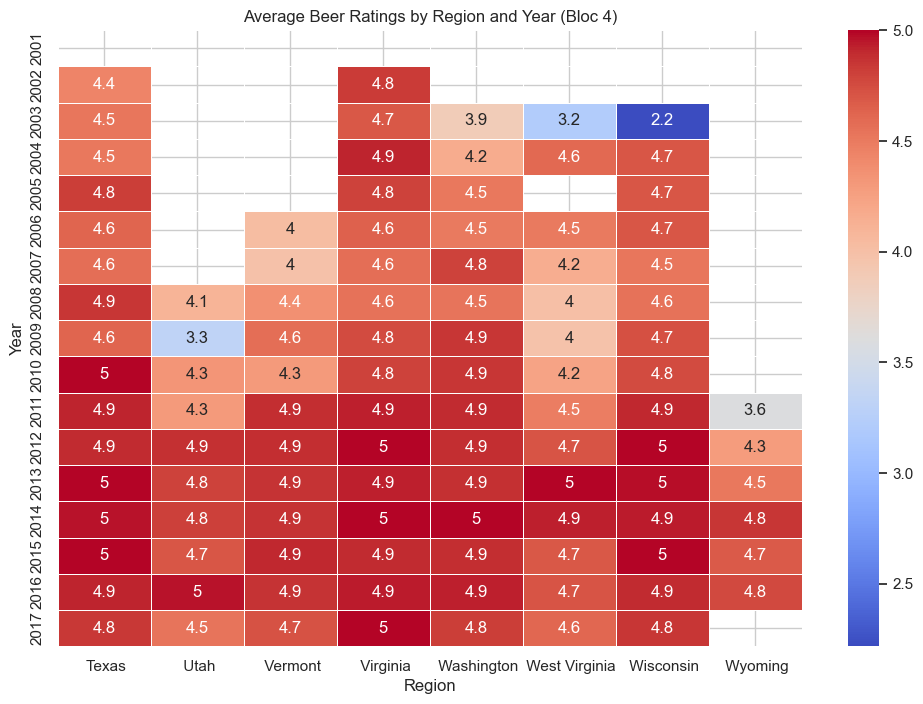

In [124]:

chunk_size = 14
num_chunks = len(pivot_data_us_ba.columns) // chunk_size + (1 if len(pivot_data_us.columns) % chunk_size != 0 else 0)

for i in range(num_chunks):
    start = i * chunk_size
    end = start + chunk_size
    chunk = pivot_data_us_ba.iloc[:, start:end]  
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(chunk, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title(f'Average Beer Ratings by Region and Year , BeerAdvocate(Bloc {i+1})')
    plt.xlabel('Region')
    plt.ylabel('Year')
    plt.show()

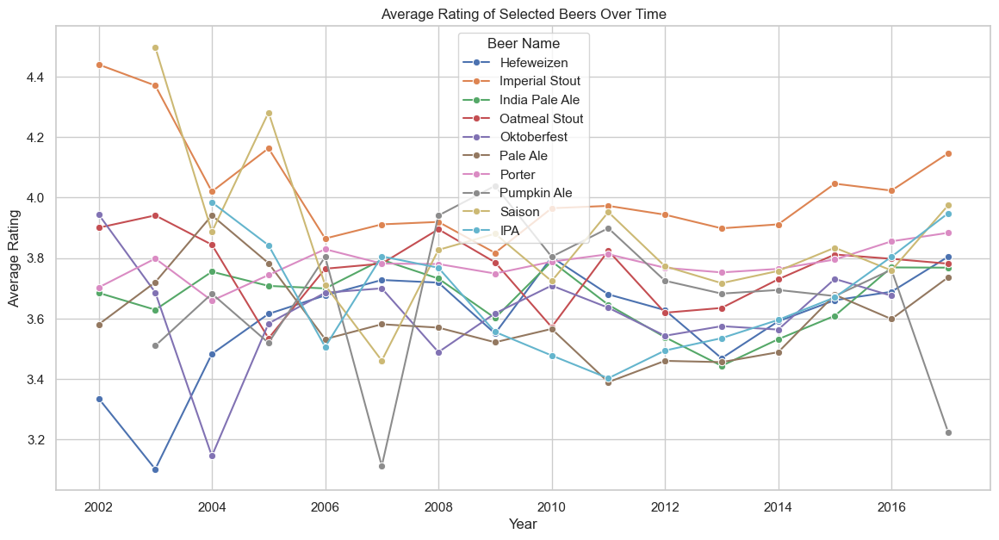

In [128]:

top_beers_ba = weighted_avg_ratings_ba['beer_name'].value_counts().nlargest(10).index
time_series_data_ba = weighted_avg_ratings_ba[weighted_avg_ratings_ba['beer_name'].isin(top_beers)]

time_series_data_ba = time_series_data_ba.groupby(['year', 'beer_name']).agg({'weighted_avg_rating': 'mean'}).reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=time_series_data_ba, x='year', y='weighted_avg_rating', hue='beer_name', marker='o')
plt.title('Average Rating of Selected Beers Over Time, BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.legend(title='Beer Name')
plt.show()


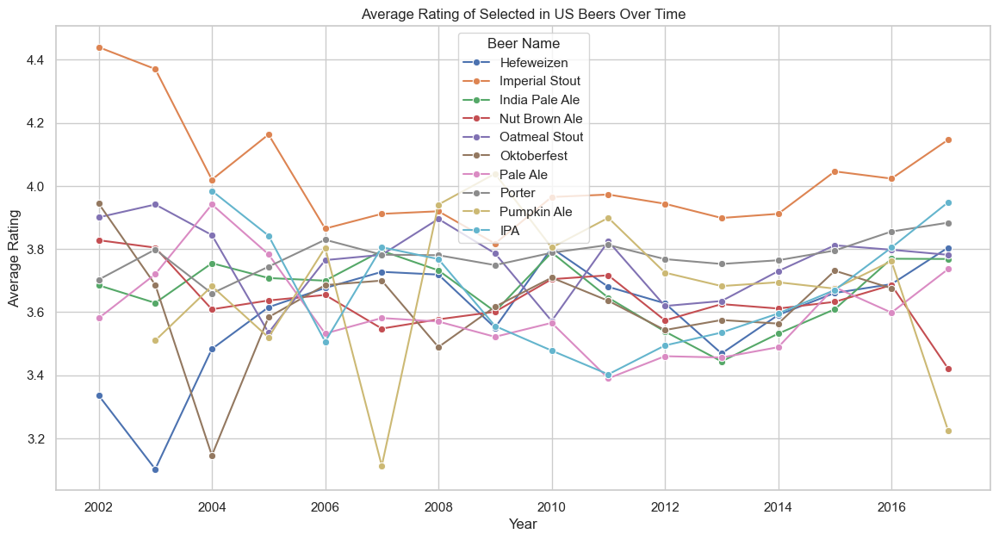

In [148]:

top_beers_ba= weighted_avg_ratings_ba[weighted_avg_ratings_ba['location_user']=='United States']['beer_name'].value_counts().nlargest(10).index
time_series_data_ba = weighted_avg_ratings_ba[weighted_avg_ratings_ba['beer_name'].isin(top_beers)]

time_series_data_ba =time_series_data_ba.groupby(['year', 'beer_name']).agg({'weighted_avg_rating': 'mean'}).reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=time_series_data_ba, x='year', y='weighted_avg_rating', hue='beer_name', marker='o')
plt.title('Average Rating of Selected in US Beers Over Time;BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.legend(title='Beer Name')
plt.show()


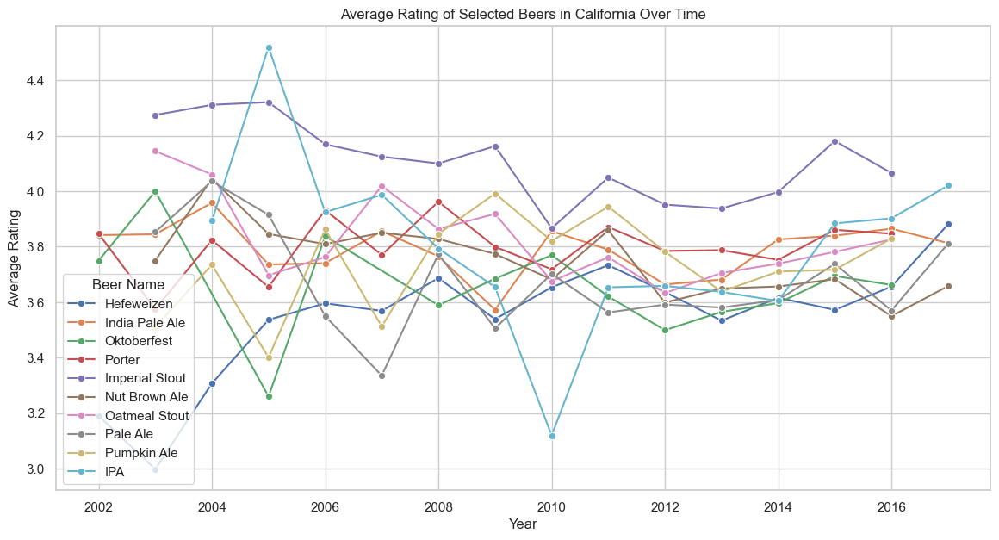

In [150]:

top_beers_cali_ba = weighted_avg_ratings_us_ba[weighted_avg_ratings_us_ba['location_region_user']=='California']['beer_name'].value_counts().nlargest(10).index
time_series_data_cali_ba = weighted_avg_ratings_us_ba[weighted_avg_ratings_us_ba['beer_name'].isin(top_beers)]

time_series_data_cali_ba = time_series_data_cali_ba.groupby(['year', 'beer_name']).agg({'weighted_avg_rating': 'mean'}).reset_index()

plt.figure(figsize=(14, 7))
sns.lineplot(data=time_series_data_cali_ba, x='year', y='weighted_avg_rating', hue='beer_name', marker='o')
plt.title('Average Rating of Selected Beers in California Over Time, BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.legend(title='Beer Name')
plt.show()



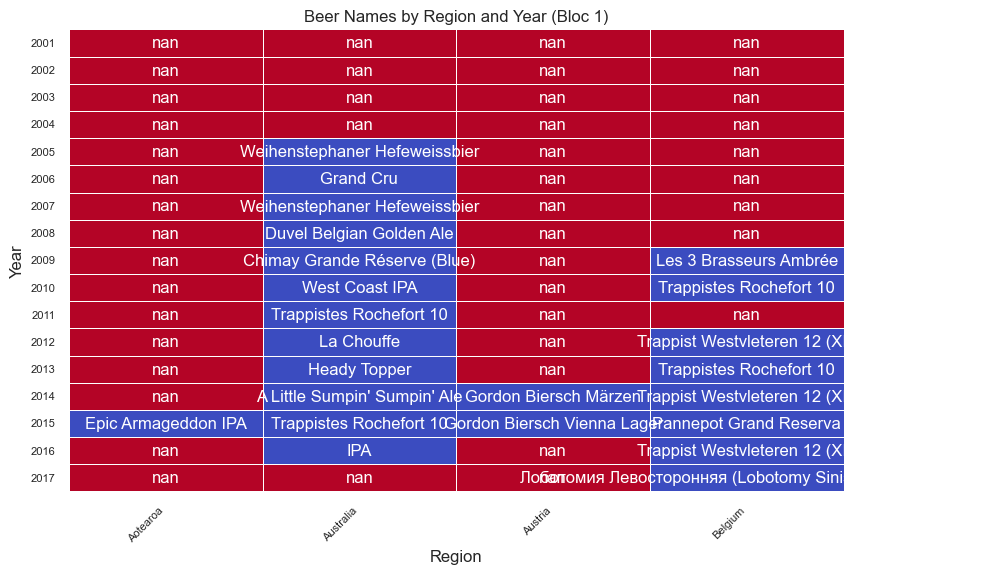

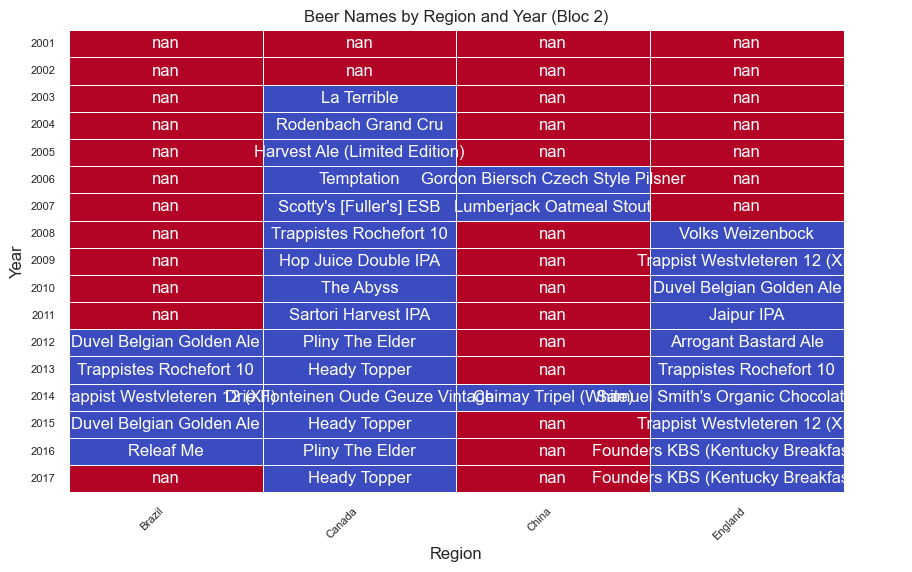

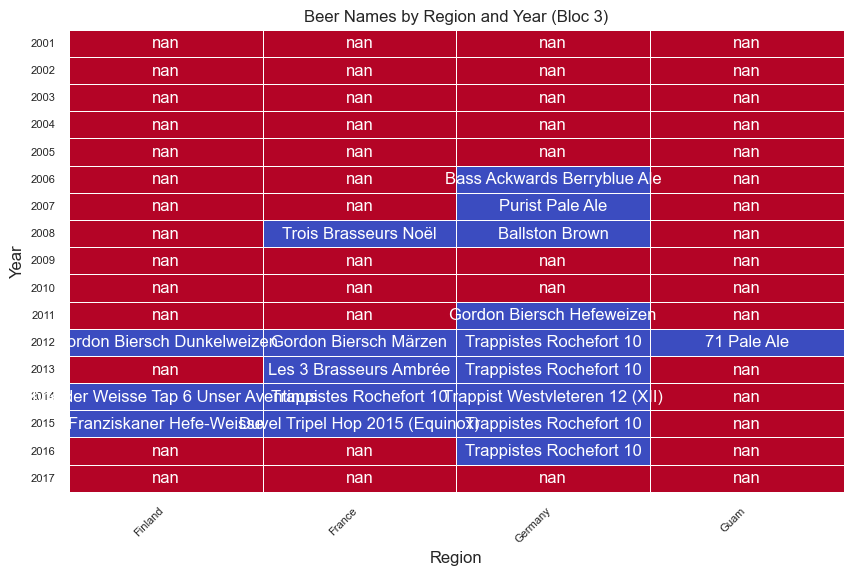

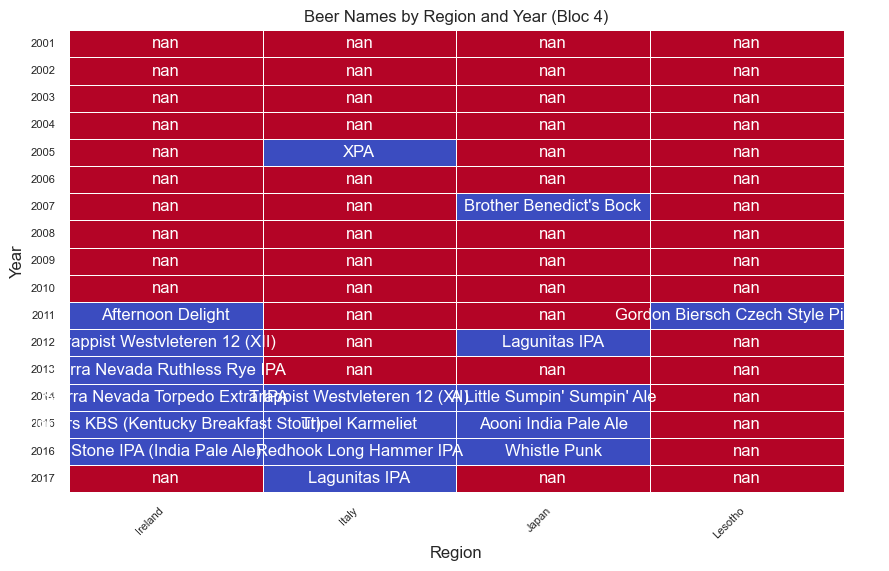

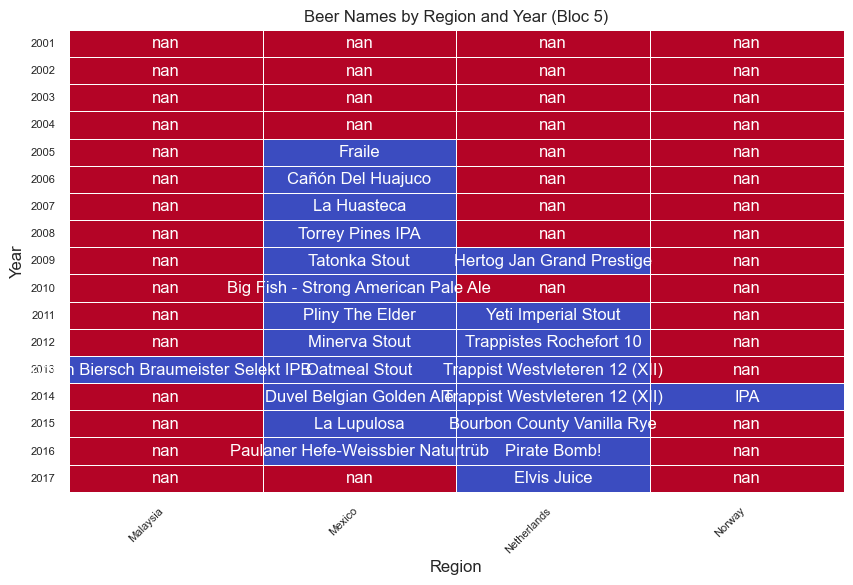

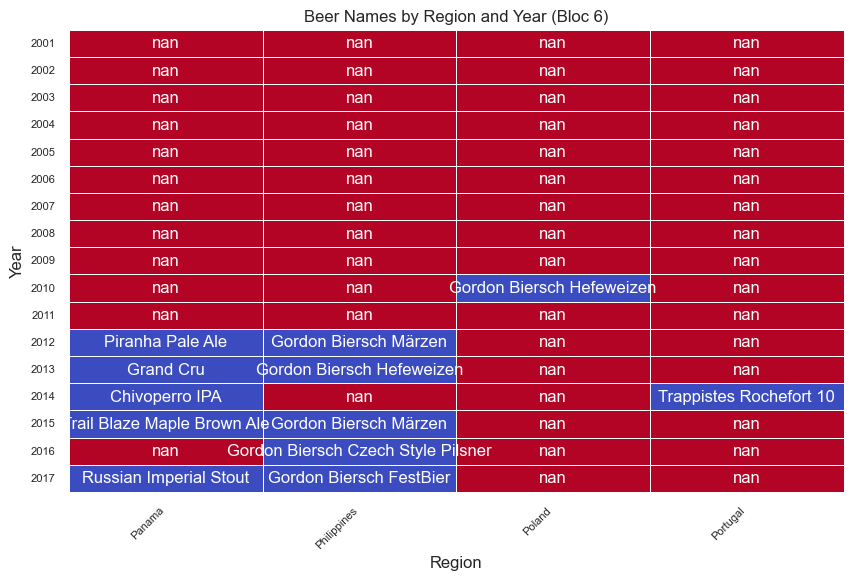

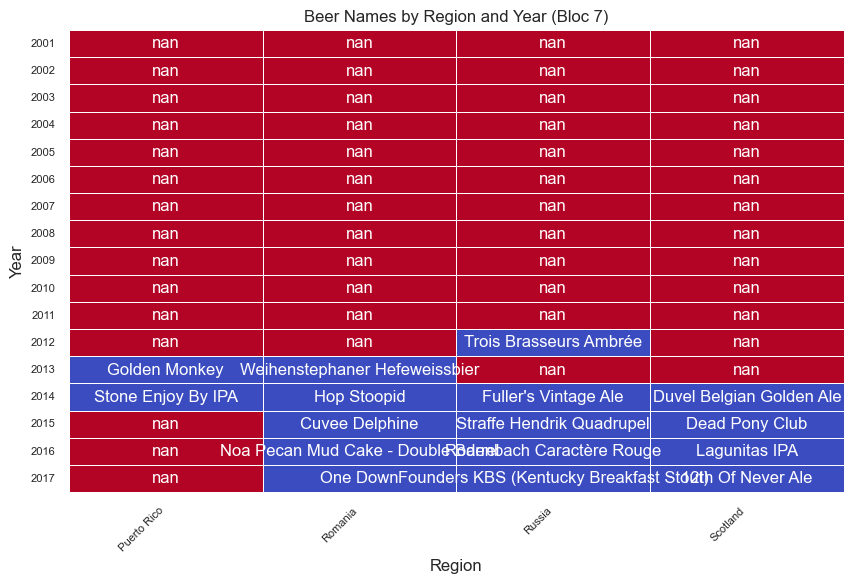

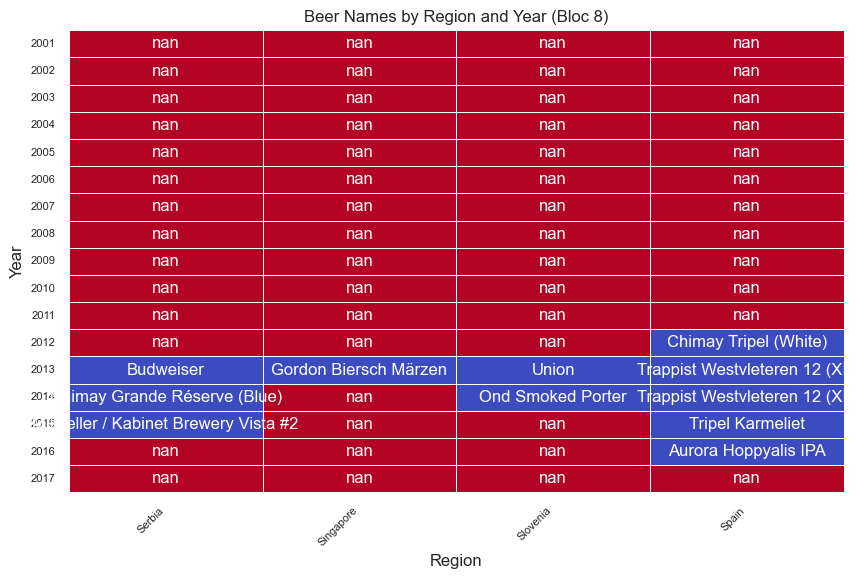

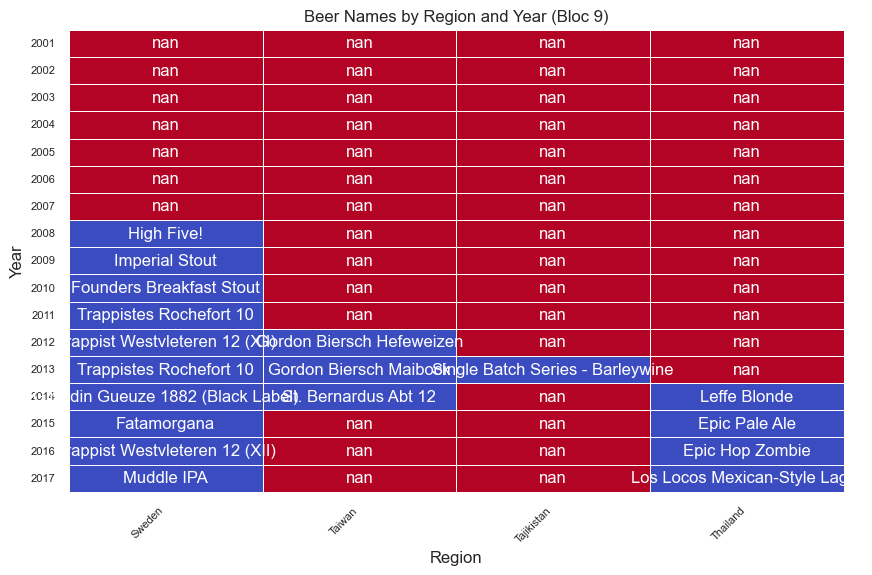

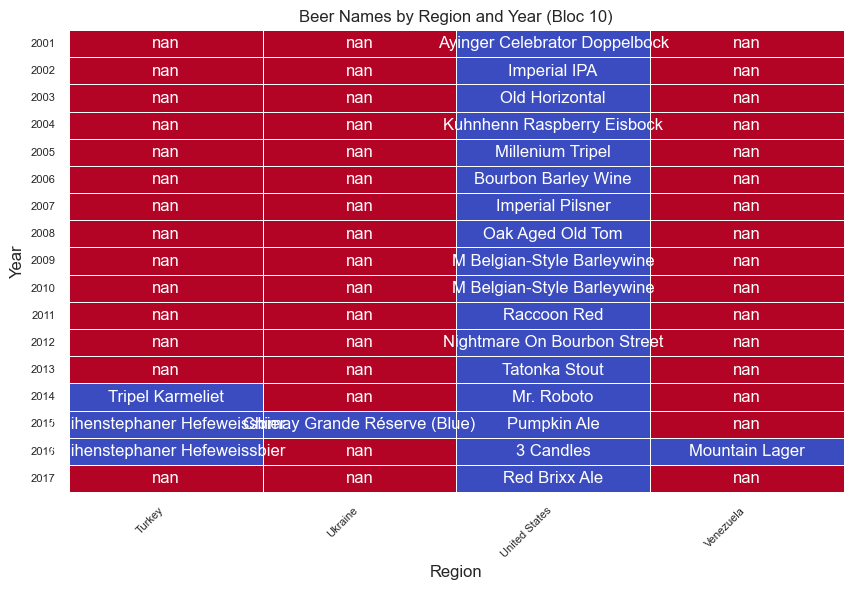

In [152]:

pivot_data_name_ba = top_ranked_beers_ba.pivot_table(
    values='beer_name', 
    index='year', 
    columns='location_user', 
    aggfunc=lambda x: ', '.join(x.dropna())
)


chunk_size = 4  
num_chunks = (pivot_data_name_ba.shape[1] + chunk_size - 1) // chunk_size

for i in range(num_chunks):
    start = i * chunk_size
    end = start + chunk_size
    chunk = pivot_data_name_ba.iloc[:, start:end]  
    
   
    plt.figure(figsize=(10, 6))  
    sns.heatmap(
        chunk.isna().astype(int),  
        annot=chunk, fmt='', cmap='coolwarm', linewidths=0.5, cbar=False
    )
    plt.title(f'Beer Names by Region and Year, BeerAdvocate (Bloc {i+1})')
    plt.xlabel('Region')
    plt.ylabel('Year')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.show()



In [154]:

review_counts_br_ba = total_ba.groupby(['brewery_id', 'year', 'location_user']).size().reset_index(name='review_count')


reviews_with_counts_br_ba = pd.merge(total_ba, review_counts_br_ba, on=['brewery_id', 'year', 'location_user'])
filtered_reviews_br_ba = reviews_with_counts_br_ba[reviews_with_counts_br_ba['review_count'] >= 5]

weighted_avg_ratings_br_ba = filtered_reviews_br_ba.groupby(['brewery_id','brewery_name', 'year','review_count', 'location_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')


weighted_avg_ratings_br_ba['rank'] = (
    weighted_avg_ratings_br_ba.sort_values(['year', 'location_user', 'weighted_avg_rating', 'review_count'], 
                                        ascending=[True, True, False, False])
    .groupby(['year', 'location_user'])
    .cumcount() + 1
)

# Check results


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/1567738573.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_ratings_br = filtered_reviews_br.groupby(['brewery_id','brewery_name', 'year','review_count', 'location_user']).apply(


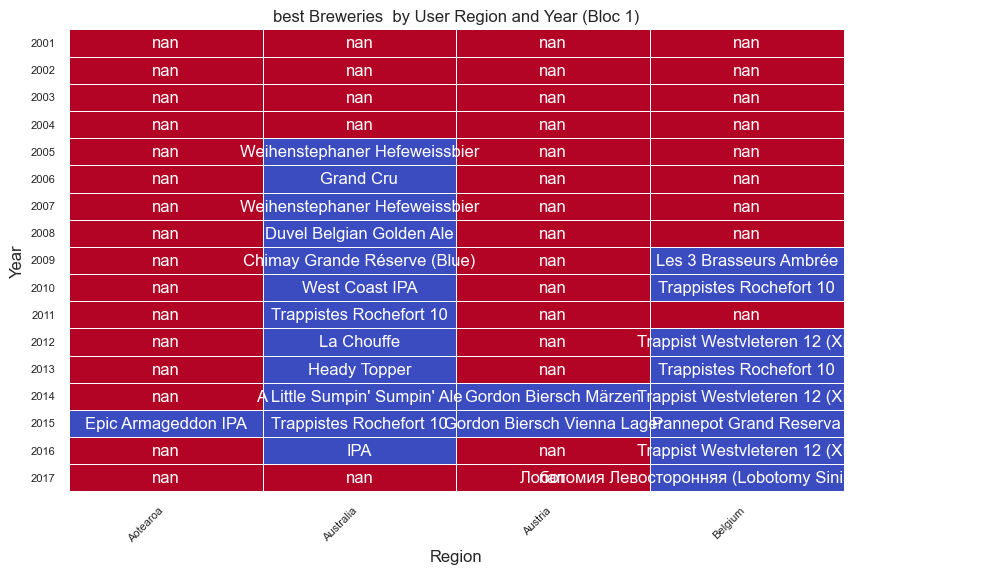

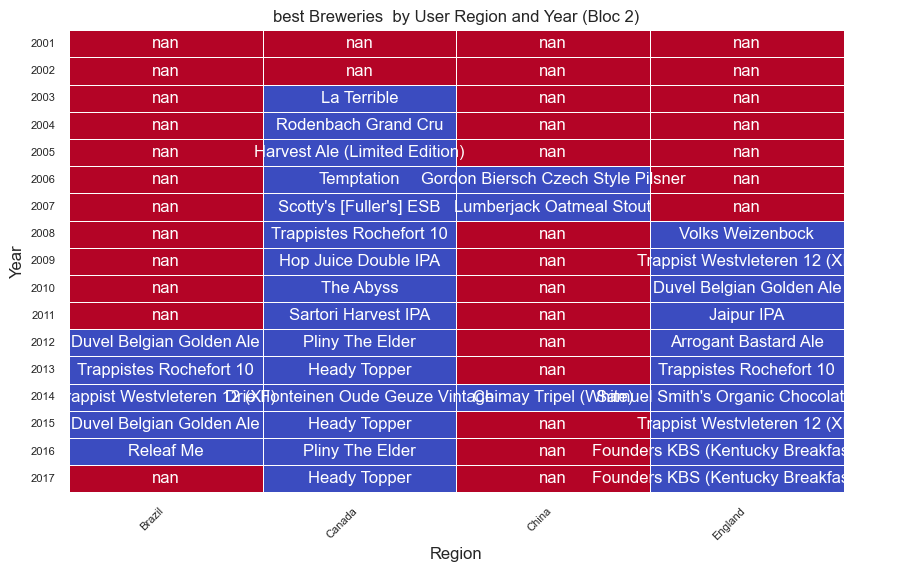

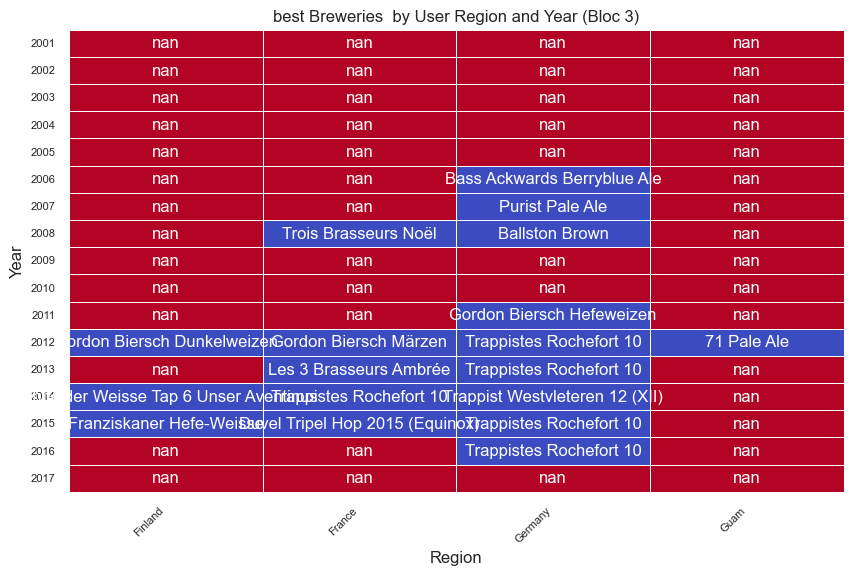

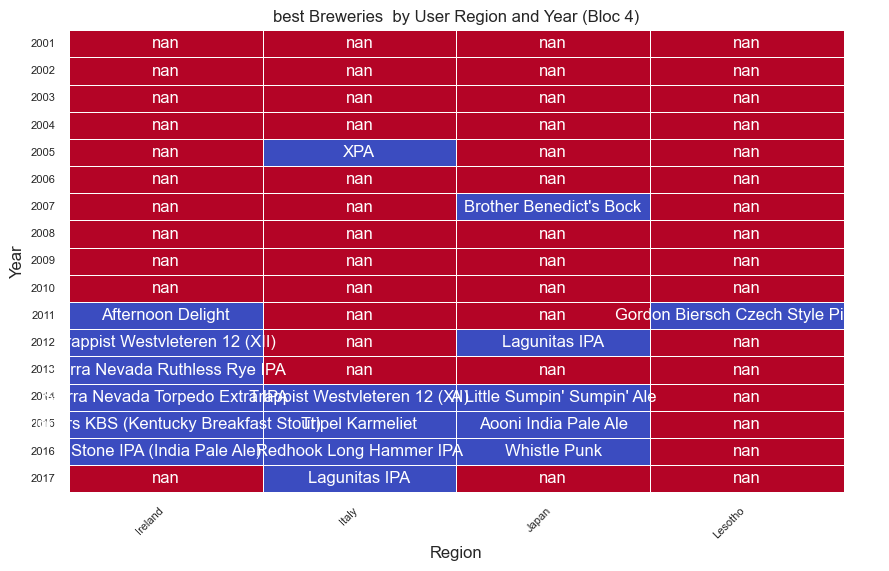

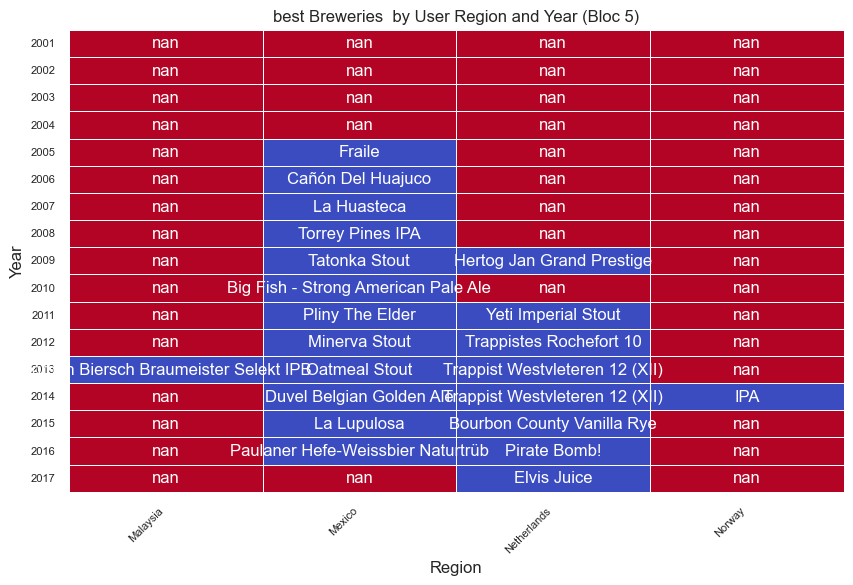

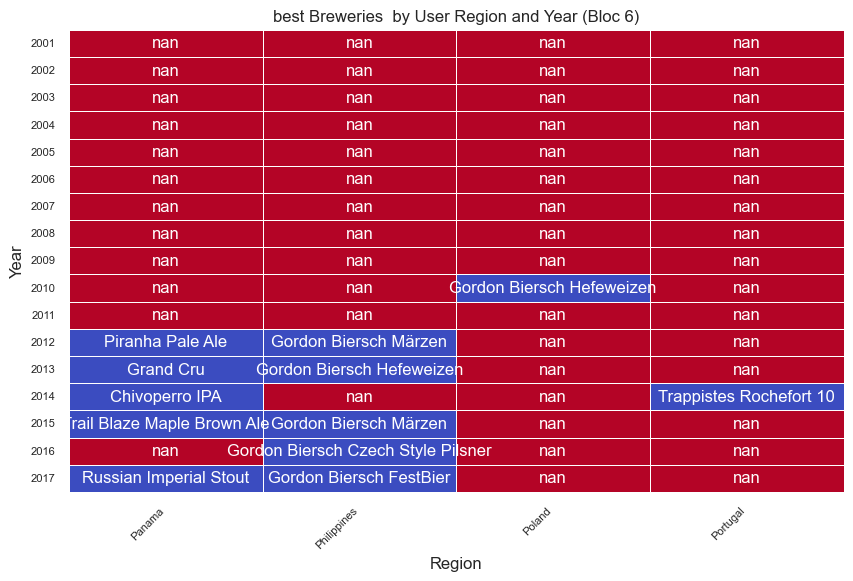

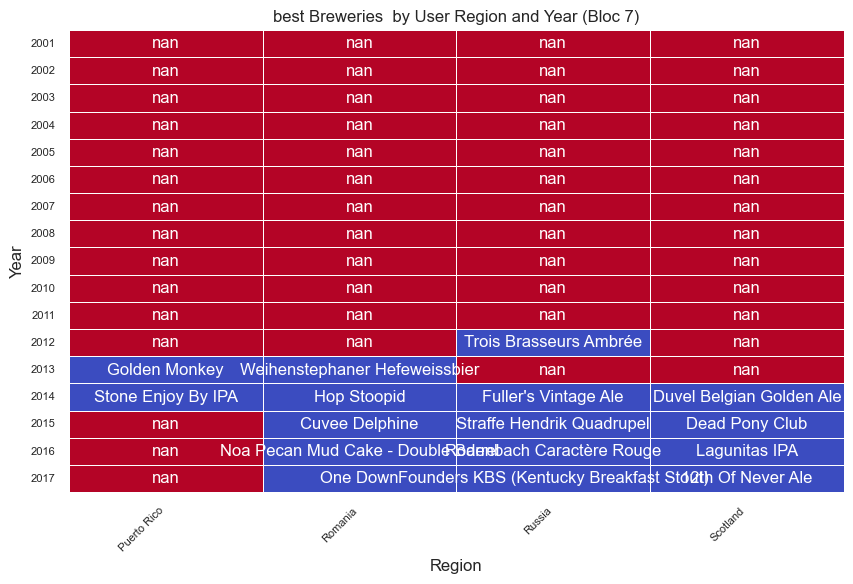

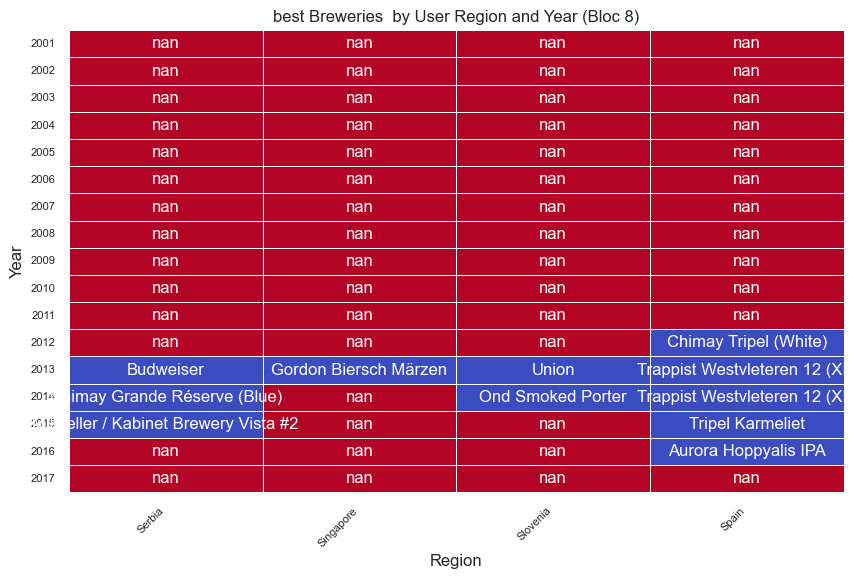

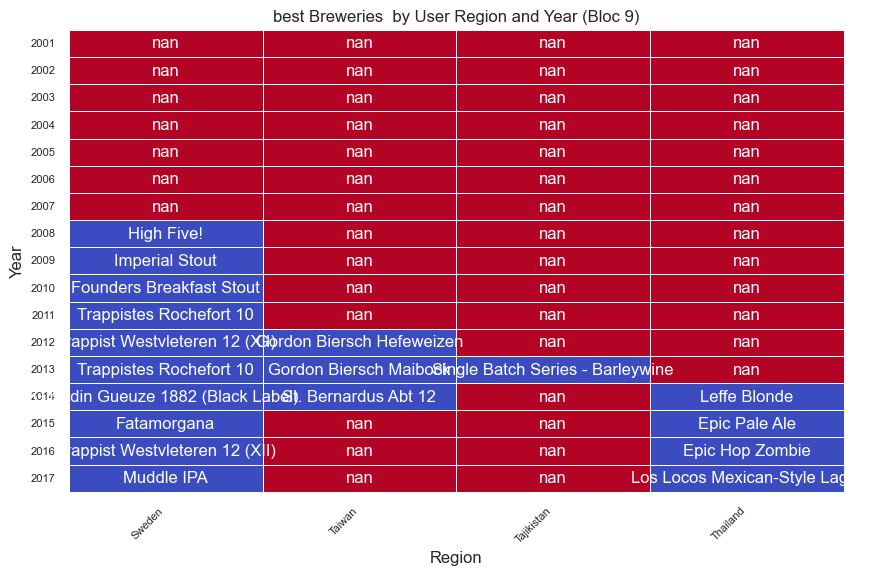

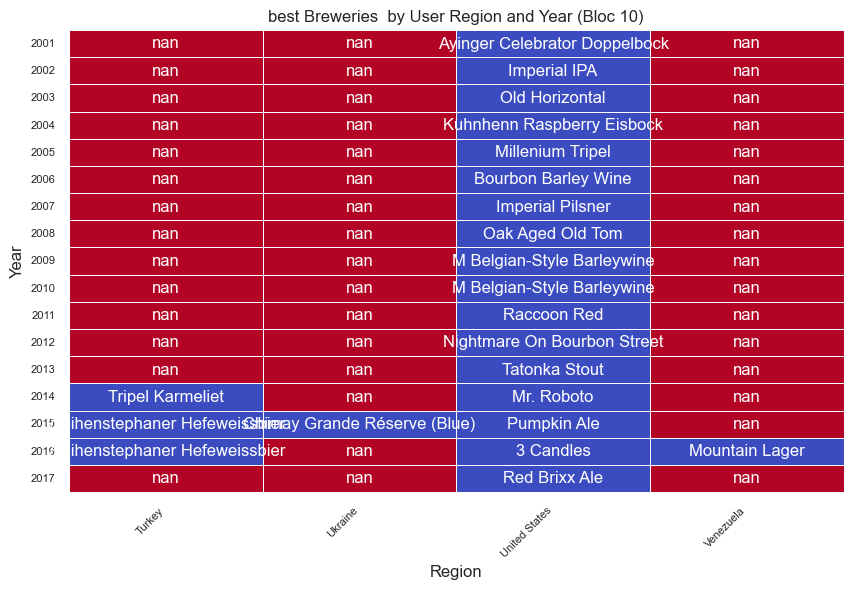

In [162]:
top_ranked_beers_br_ba = weighted_avg_ratings_br_ba[weighted_avg_ratings_br_ba['rank'] == 1]


pivot_data_br_ba = top_ranked_beers_br_ba.pivot_table(
    values='brewery_name', 
    index='year', 
    columns='location_user', 
    aggfunc=lambda x: ', '.join(x.dropna())
)


chunk_size = 4  
num_chunks = (pivot_data_name_ba.shape[1] + chunk_size - 1) // chunk_size

for i in range(num_chunks):
    start = i * chunk_size
    end = start + chunk_size
    chunk = pivot_data_name_ba.iloc[:, start:end] 
    
    
    plt.figure(figsize=(10, 6))  
    sns.heatmap(
        chunk.isna().astype(int), 
        annot=chunk, fmt='', cmap='coolwarm', linewidths=0.5, cbar=False
    )
    plt.title(f'best Breweries  by User Region and Year , BeerAdvocate(Bloc {i+1})')
    plt.xlabel('Region')
    plt.ylabel('Year')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.show()



Correlation between Number of reviews and average rating: 0.04287318053695489


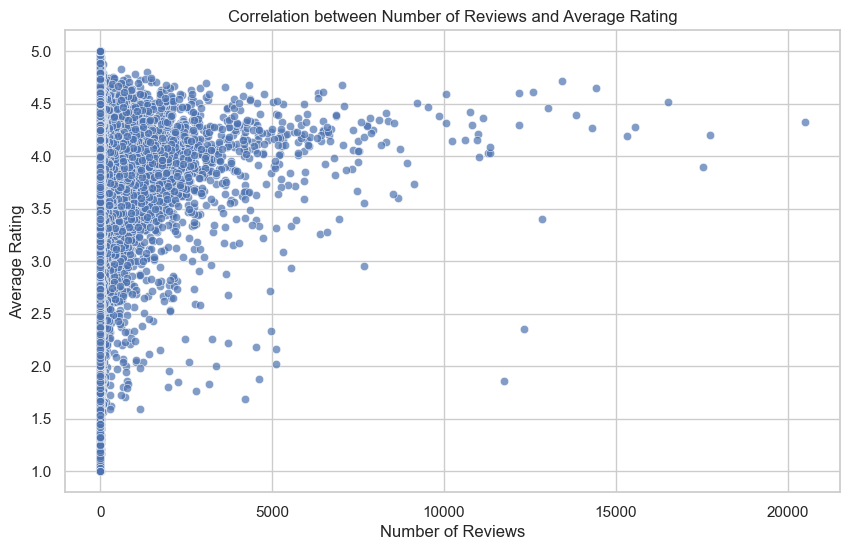

In [164]:
import pandas as pd
import matplotlib.pyplot as plt


# Calculate the total ratings and review count for each beer
beer_stats_ba = total_ba.groupby('beer_id').agg(
    total_ratings=('rating', 'sum'),       # Sum of regular ratings for each beer
    review_count=('rating', 'count')       # Count of the number of reviews for each beer
).reset_index()

# Calculate the average rating for each beer (regular, not weighted)
beer_stats_ba['average_rating'] = beer_stats_ba['total_ratings'] / beer_stats_ba['review_count']

# Calculate correlation between the number of reviews and the average rating
correlation_ba = beer_stats_ba[['review_count', 'average_rating']].corr().iloc[0, 1]
print(f"Correlation between Number of reviews and average rating, BeerAdvocate: {correlation_ba}")

# Visualize the correlation between review count and average rating
plt.figure(figsize=(10, 6))
sns.scatterplot(data=beer_stats_ba, x='review_count', y='average_rating', alpha=0.7)
plt.title('Correlation between Number of Reviews and Average Rating, BeerAdvocate')
plt.xlabel('Number of Reviews')
plt.ylabel('Average Rating')
plt.grid(True)
plt.show()

In [166]:

review_counts_fl_ba = total_ba.groupby(['style', 'year', 'location_user']).size().reset_index(name='review_count')


reviews_with_counts_fl_ba = pd.merge(total_ba, review_counts_fl_ba, on=['style', 'year', 'location_user'])
filtered_reviews_fl_ba= reviews_with_counts_fl_ba[reviews_with_counts_fl_ba['review_count'] >= 5]

weighted_avg_ratings_fl_ba= filtered_reviews_fl_ba.groupby(['style', 'year','review_count', 'location_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')


weighted_avg_ratings_fl_ba['rank'] = (
    weighted_avg_ratings_fl_ba.sort_values(['year', 'location_user', 'weighted_avg_rating', 'review_count'], 
                                        ascending=[True, True, False, False])
    .groupby(['year', 'location_user'])
    .cumcount() + 1
)

# Check results


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/1705808618.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_ratings_fl = filtered_reviews_fl.groupby(['style', 'year','review_count', 'location_user']).apply(


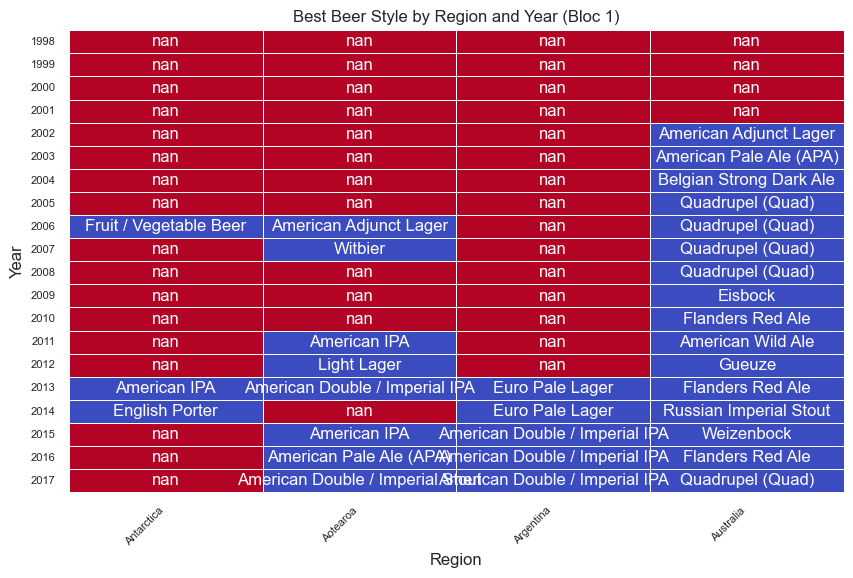

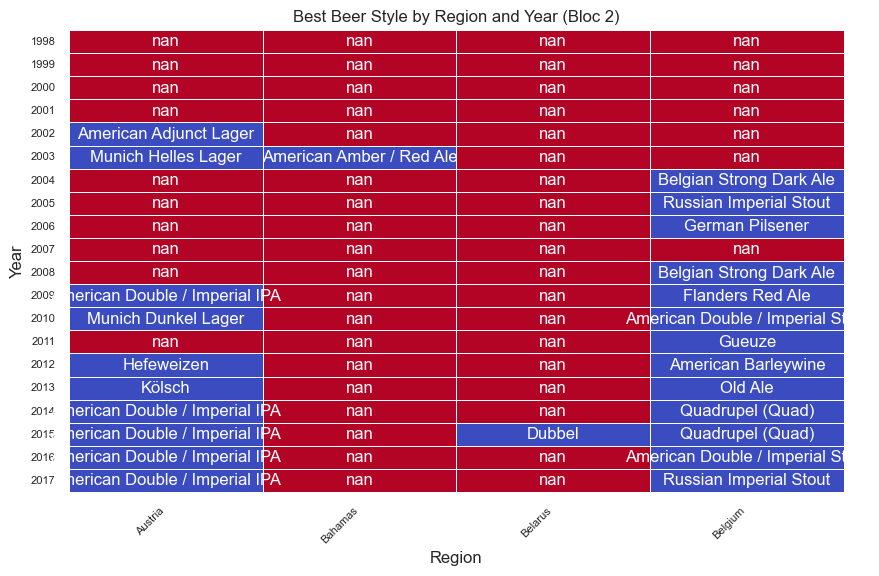

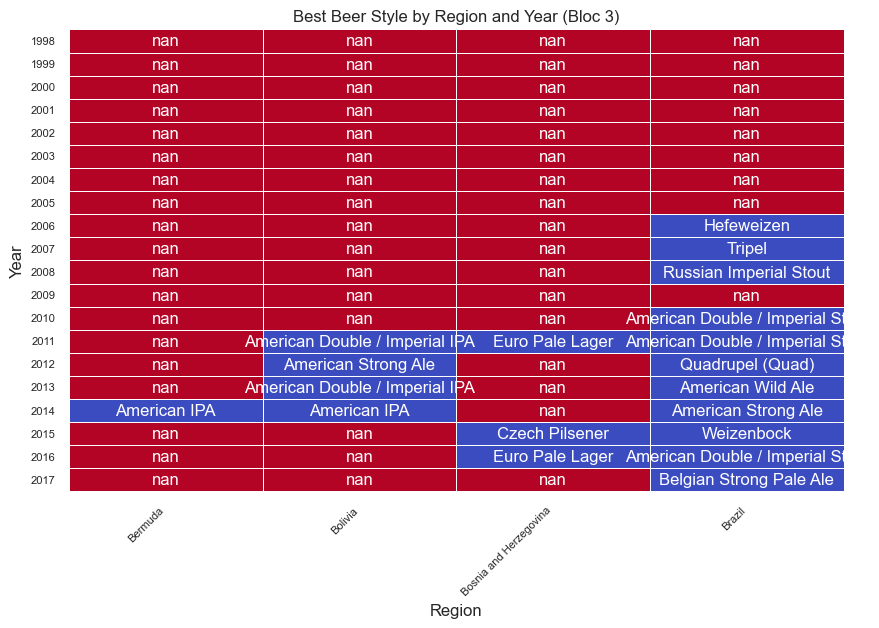

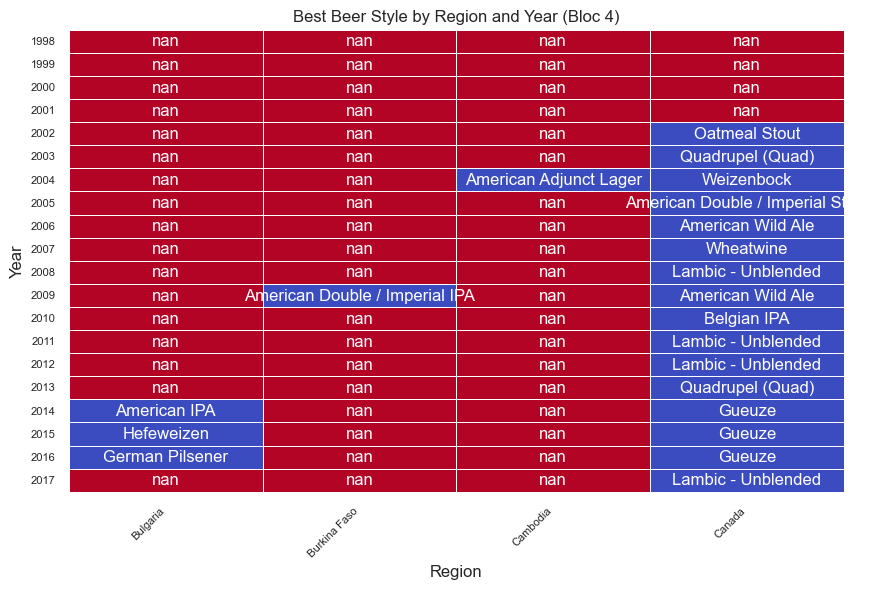

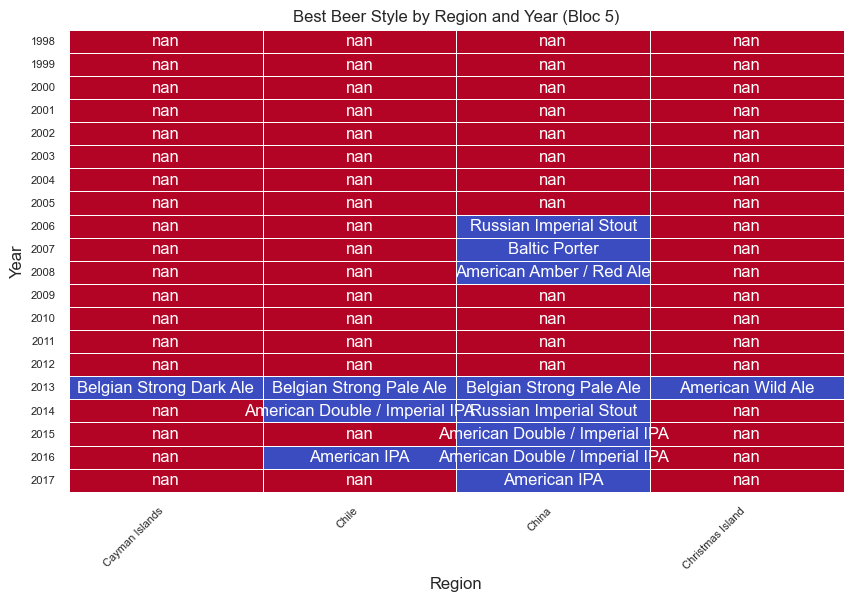

...

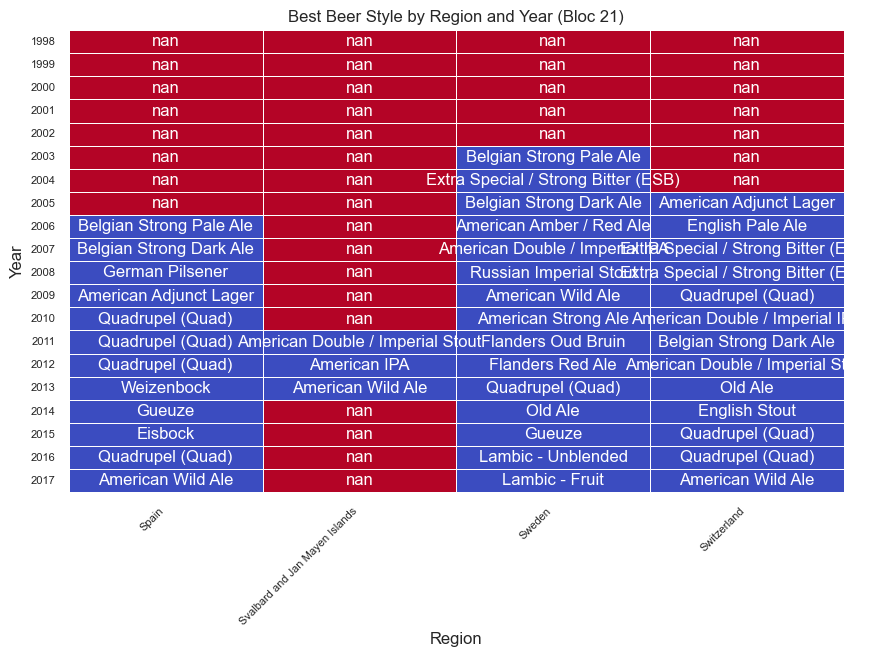

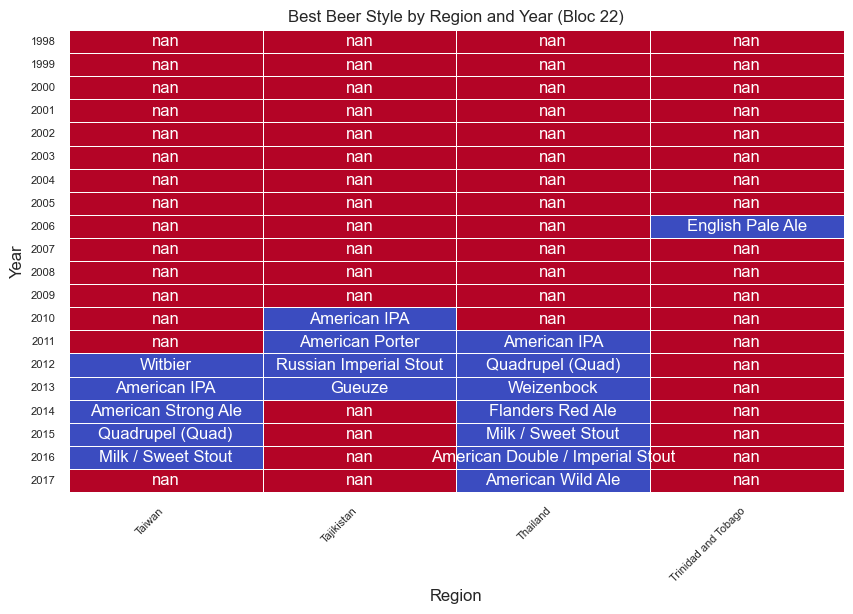

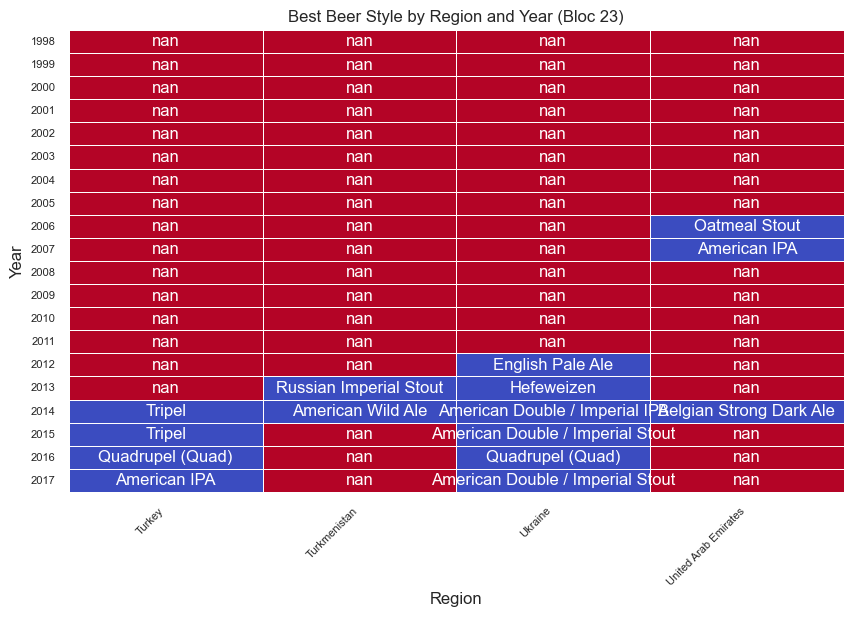

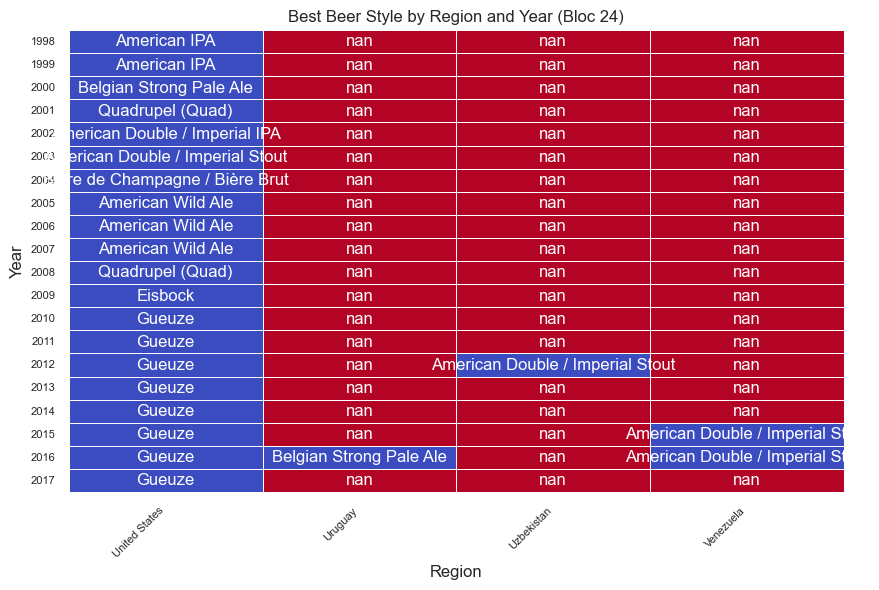

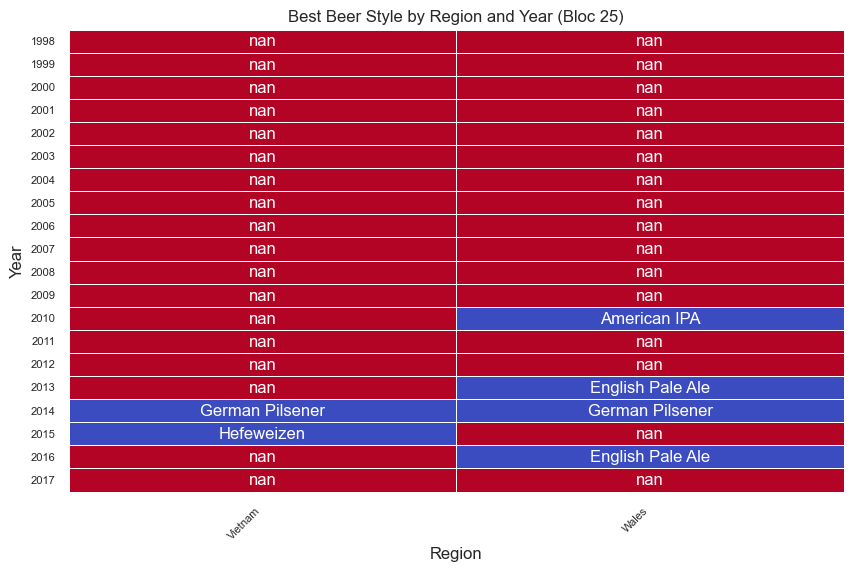

In [168]:
top_ranked_beers_fl_ba = weighted_avg_ratings_fl_ba[weighted_avg_ratings_fl_ba['rank'] == 1]

pivot_data_fl_ba = top_ranked_beers_fl_ba.pivot_table(
    values='style', 
    index='year', 
    columns='location_user', 
    aggfunc=lambda x: ', '.join(x.dropna())
)


chunk_size = 4  
num_chunks = (pivot_data_fl_ba.shape[1] + chunk_size - 1) // chunk_size

for i in range(num_chunks):
    start = i * chunk_size
    end = start + chunk_size
    chunk = pivot_data_fl_ba.iloc[:, start:end] 
   
    plt.figure(figsize=(10, 6)) 
    sns.heatmap(
        chunk.isna().astype(int), 
        annot=chunk, fmt='', cmap='coolwarm', linewidths=0.5, cbar=False
    )
    plt.title(f'Best Beer Style by Region and Year, BeerADvocate(Bloc {i+1})')
    plt.xlabel('Region')
    plt.ylabel('Year')
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.show()


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/1857049255.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_styles = filtered_reviews.groupby(['style']).apply(


Correlation between  style (coded) e Weighted average rating: -0.8628461722766614


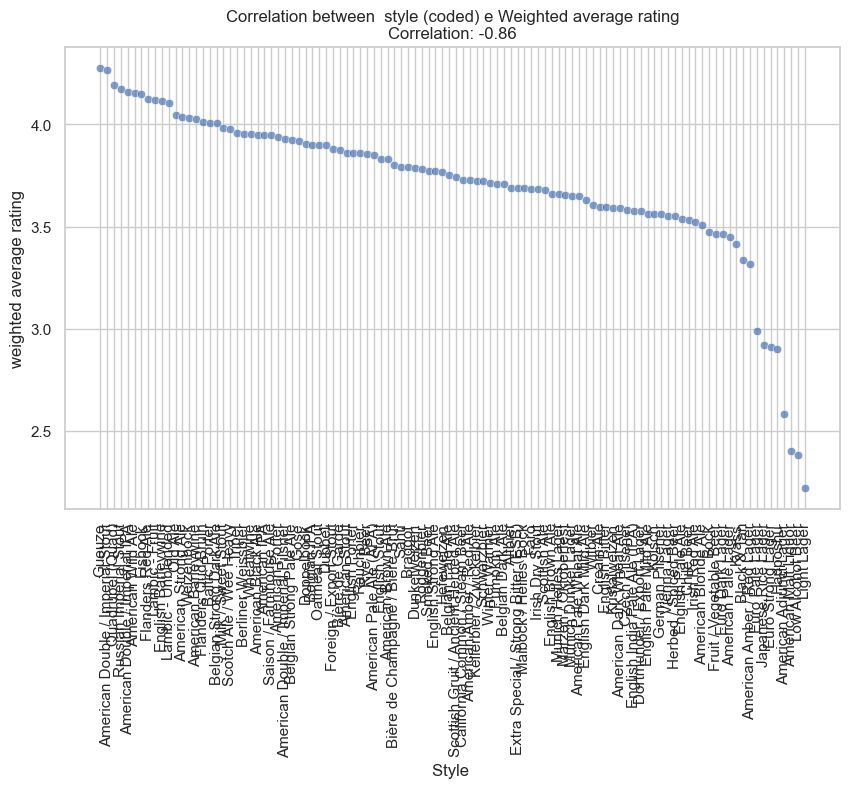

In [174]:
review_counts_ba = total_ba.groupby(['style']).size().reset_index(name='review_count')

# Merge the reviews with their review counts based on style, year, and user location
reviews_with_counts_ba = pd.merge(total_ba, review_counts_ba, on=['style'])

# Filter the reviews to include only those with at least 5 reviews
filtered_reviews_ba = reviews_with_counts_ba[reviews_with_counts_ba['review_count'] >= 5]

# Calculate the weighted average rating for each beer style and user location
weighted_avg_styles_ba = filtered_reviews_ba.groupby(['style']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')

# Sort by weighted average rating
weighted_avg_styles_ba= weighted_avg_styles_ba.sort_values('weighted_avg_rating', ascending=False)


weighted_avg_styles_ba['style_code'] = pd.factorize(weighted_avg_styles_ba['style'])[0]

correlation_ba= weighted_avg_styles_ba[['style_code', 'weighted_avg_rating']].corr().iloc[0, 1]

print(f"Correlation between  style (coded) e Weighted average rating, BeerAdvocate: {correlation_ba}")

plt.figure(figsize=(10, 6))
sns.scatterplot(data=weighted_avg_styles_ba, x='style_code', y='weighted_avg_rating', alpha=0.7)
plt.title(f'Correlation between  style (coded) e Weighted average rating, BeerAdvocate\nCorrelation: {correlation:.2f}')
plt.xlabel('Style ')
plt.ylabel('weighted average rating')
plt.xticks(weighted_avg_styles['style_code'], weighted_avg_styles['style'], rotation=90)
plt.grid(True)
plt.show()


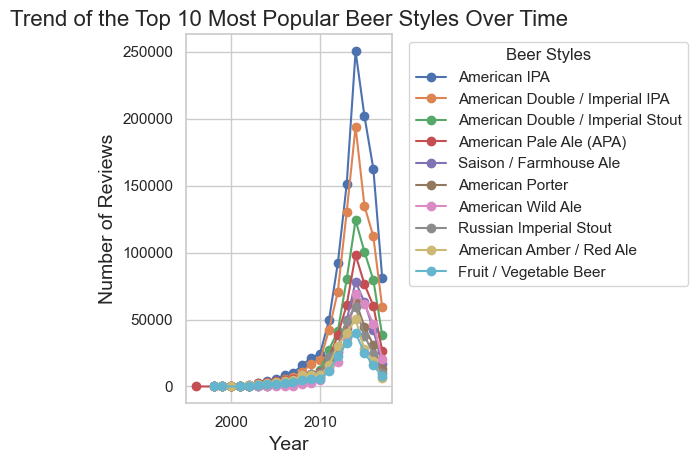

In [186]:
import pandas as pd
import matplotlib.pyplot as plt

style_review_count_ba = total_ba.groupby(['year', 'style']).size().reset_index(name='review_count')

style_avg_ratings_ba = total_ba.groupby(['year', 'style'])['rating'].mean().reset_index(name='average_rating')

most_reviewed_style_idx_ba = style_review_count_ba.groupby('year')['review_count'].idxmax()
most_reviewed_style_ba = style_review_count_ba.loc[most_reviewed_style_idx_ba]

style_analysis_ba = pd.merge(most_reviewed_style_ba, style_avg_ratings_ba, on=['year', 'style'], how='left')

top_10_styles_ba = style_review_count_ba.groupby('style')['review_count'].sum().nlargest(10).index

# Filter the dataframe to include only the top 10 most popular styles
top_styles_data_ba = style_review_count_ba[style_review_count_ba['style'].isin(top_10_styles_ba)]

# Plot data for each of the 10 most popular styles
for style in top_10_styles_ba:
    style_data_ba = top_styles_data_ba[top_styles_data_ba['style'] == style]
    plt.plot(style_data_ba['year'], style_data_ba['review_count'], label=style, marker='o')

# Add title, labels, and legend
plt.title('Trend of the Top 10 Most Popular Beer Styles Over Time,BeerAdvocate', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Reviews', fontsize=14)
plt.legend(title="Beer Styles", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

# Add layout to prevent cutting off titles
plt.tight_layout()

# Display the plot
plt.show()



In [188]:
# Group reviews by style, year, and user location, then count the number of reviews for each combination
review_counts_fl_ba = total_ba.groupby(['style', 'year', 'location_user']).size().reset_index(name='review_count')

# Merge the reviews with their review counts based on style, year, and user location
reviews_with_counts_fl_ba= pd.merge(total_ba, review_counts_fl_ba, on=['style', 'year', 'location_user'])

# Filter the reviews to include only those with at least 5 reviews
filtered_reviews_fl_ba = reviews_with_counts_fl_ba[reviews_with_counts_fl_ba['review_count'] >= 5]

# Calculate the weighted average rating for each beer style and user location
weighted_avg_styles_location_ba = filtered_reviews_fl_ba.groupby(['style', 'location_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')

# Sort by weighted average rating
weighted_avg_styles_location_ba = weighted_avg_styles_location_ba.sort_values('weighted_avg_rating', ascending=False)

# Encode beer styles as numbers to calculate correlation
weighted_avg_styles_location_ba['style_code'] = pd.factorize(weighted_avg_styles_location_ba['style'])[0]

# Encode user location as numbers for correlation
weighted_avg_styles_location_ba['location_user_code'] = pd.factorize(weighted_avg_styles_location[_ba'location_user'])[0]

# Calculate the correlation between "style_code", "location_user_code", and "weighted_avg_rating"
correlation_style_location_ba = weighted_avg_styles_location_ba[['style_code', 'location_user_code', 'weighted_avg_rating']].corr()

# Display the correlation matrix
print("Correlation between style, location, and weighted average rating, BeerAdvocate:")
print(correlation_style_location)


Correlation between style, location, and weighted average rating:
                     style_code  location_user_code  weighted_avg_rating
style_code             1.000000            0.111717            -0.650623
location_user_code     0.111717            1.000000            -0.180699
weighted_avg_rating   -0.650623           -0.180699             1.000000


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/2938561475.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_styles_location = filtered_reviews_fl.groupby(['style', 'location_user']).apply(


Correlation between year and weighted average rating:
                         year  weighted_avg_rating
year                 1.000000             0.484387
weighted_avg_rating  0.484387             1.000000


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_36714/3552441662.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_year = filtered_reviews_y.groupby('year').apply(


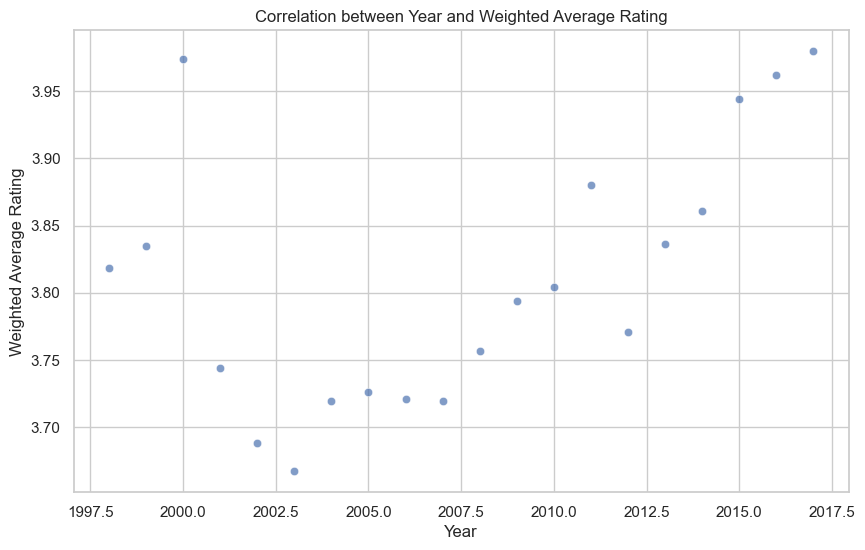

In [190]:
# Group data by year and calculate the total number of reviews per year
review_counts_y_ba = total_ba.groupby(['year']).size().reset_index(name='review_count')

# Merge the reviews data with the review count data based on the year
reviews_with_counts_y_ba= pd.merge(total_ba, review_counts_y_ba, on=['year'])

# Filter reviews where the review count per year is greater than or equal to 5
filtered_reviews_y_ba = reviews_with_counts_y_ba[reviews_with_counts_y_ba['review_count'] >= 5]

# Calculate the weighted average rating per year
weighted_avg_year_ba = filtered_reviews_y_ba.groupby('year').apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')

# Calculate the correlation between the year and the weighted average rating
correlation_year_score_ba = weighted_avg_year_ba[['year', 'weighted_avg_rating']].corr()

# Display the correlation matrix
print("Correlation between year and weighted average rating, Beeradvocate:")
print(correlation_year_score)

# Display a scatter plot to better understand the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=weighted_avg_year_ba, x='year', y='weighted_avg_rating', alpha=0.7)
plt.title('Correlation between Year and Weighted Average Rating,BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Weighted Average Rating')
plt.grid(True)
plt.show()


Correlazione tra anno e valutazione media ponderata:
                         year  location_user_code  weighted_avg_rating
year                 1.000000            0.447303             0.162882
location_user_code   0.447303            1.000000            -0.012134
weighted_avg_rating  0.162882           -0.012134             1.000000


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_30173/534838547.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_avg_year = filtered_reviews_y.groupby(['year', 'location_user']).apply(


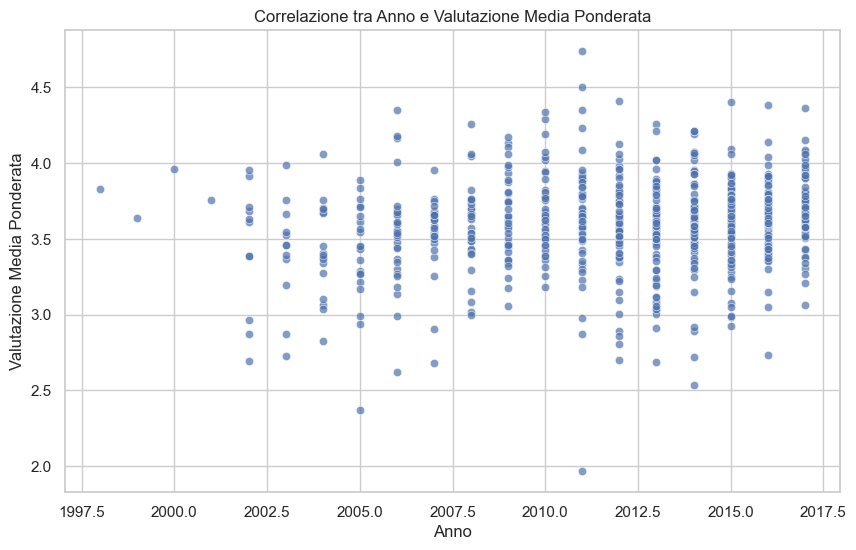

In [133]:
# Group data by year and location, and count the number of reviews for each combination
review_counts_y_ba = total_ba.groupby(['year', 'location_user']).size().reset_index(name='review_count')

# Merge the reviews data with the review count data based on the year and location_user
reviews_with_counts_y_ba = pd.merge(total_ba, review_counts_y_ba, on=['year', 'location_user'])

# Filter reviews where the review count per year and location is greater than or equal to 5
filtered_reviews_y_ba = reviews_with_counts_y_ba[reviews_with_counts_y_ba['review_count'] >= 5]

# Calculate the weighted average rating per year and location_user
weighted_avg_year_ba = filtered_reviews_y_ba.groupby(['year', 'location_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')

# Encode location_user as a numerical code for correlation calculation
weighted_avg_year_ba['location_user_code'] = pd.factorize(weighted_avg_year_ba['location_user'])[0]

# Calculate the correlation between year, location_user_code, and weighted average rating
correlation_year_score_ba = weighted_avg_year_ba[['year', 'location_user_code', 'weighted_avg_rating']].corr()

# Display the correlation matrix
print("Correlation between year, Location of the user and weighted average rating, BeerAdvocate:")print(correlation_year_scoreV)
print(correlation_year_score_ba)
# Display a scatter plot to better understand the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=weighted_avg_year_ba, x='year', y='weighted_avg_rating', alpha=0.7)
plt.title('Correlation between Year, Location of the user and Weighted Average Rating, BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Weighted Average Rating')
plt.grid(True)
plt.show()


In [ ]:
# Group data by year and location, and count the number of reviews for each combination
review_counts_y_ba = total_ba.groupby(['year', 'location_user','style']).size().reset_index(name='review_count')

# Merge the reviews data with the review count data based on the year and location_user
reviews_with_counts_y_ba= pd.merge(total_ba, review_counts_y_ba, on=['year', 'location_user','style'])

# Filter reviews where the review count per year and location is greater than or equal to 5
filtered_reviews_y_ba = reviews_with_counts_y_ba[reviews_with_counts_y_ba['review_count'] >= 5]

# Calculate the weighted average rating per year and location_user
weighted_avg_year_ba = filtered_reviews_y_ba.groupby(['year', 'location_user']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')

# Encode location_user as a numerical code for correlation calculation
weighted_avg_year_ba['location_user_code'] = pd.factorize(weighted_avg_year_ba['location_user'])[0]
weighted_avg_year_ba['style_code'] = pd.factorize(weighted_avg_year_ba['style'])[0]

# Calculate the correlation between year, location_user_code, and weighted average rating
correlation_year_score_ba= weighted_avg_year_ba[['year', 'location_user_code', 'weighted_avg_rating','style_code']].corr()

# Display the correlation matrix
print("Correlation between year,location of the user, style and weighted average rating, BeerAdvocate:")
print(correlation_year_score_ba)

# Display a scatter plot to better understand the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=weighted_avg_year_ba, x='year', y='weighted_avg_rating', alpha=0.7)
plt.title('Correlation between year,location of the user, style and weighted average rating, BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Weighted Average Rating')
plt.grid(True)
plt.show()


In [ ]:
review_counts_abv_ba = total_ba.groupby(['abv']).size().reset_index(name='review_count')

# Merge the reviews data with the review count data based on the year and location_user
reviews_with_counts_abv_ba = pd.merge(total_ba, review_counts_abv_ba, on=['abv'])

# Filter reviews where the review count per year and location is greater than or equal to 5
filtered_reviews_abv_ba = reviews_with_counts_abv_ba[reviews_with_counts_abv_ba['review_count'] >= 5]

# Calculate the weighted average rating per year and location_user
weighted_avg_abv_ba = filtered_reviews_abv_ba.groupby(['abv']).apply(
    lambda x: (x['rating'] * x['review_count']).sum() / x['review_count'].sum()
).reset_index(name='weighted_avg_rating')


# Calculate the correlation between year, location_user_code, and weighted average rating
correlation_year_score_ba = weighted_avg_year_ba[['abv', 'weighted_avg_rating']].corr()

# Display the correlation matrix
print("Correlation between abv and weighted average rating, BeerAdvocate:")
print(correlation_year_score_ba)

# Display a scatter plot to better understand the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=weighted_avg_year_ba, x='year', y='weighted_avg_rating', alpha=0.7)
plt.title('Correlation between year,location of the user, style and weighted average rating, BeerAdvocate')
plt.xlabel('Year')
plt.ylabel('Weighted Average Rating')
plt.grid(True)
plt.show()